## **ANALYSIS OF USERS MOTION PERCEPTION IN VR BASED ON DIFFERENT VISUAL AUDITORY/HAPTIC SIMULATION.**
***The steps involved in data analysis is as follows*** : 

---


- Data source identification , selection and extraction.
-Data Cleaning and transformation
- Data Exploration 
- Choosing Modelling approach
-Model development
-Model validation and testing
-Visulization and interpretation of results 
-Deployment of solution


# **Data Pre-Processing**

Data Pre-Processing step is the data cleaning and data transformation phase which  involves renaming the columns as per convience for processing the data and handling missing values which is important in a data mining and finding correlations .





***The steps involved in processing the data is as follows***: 

---
- Joining of the two excel files , renumbering the rows of the first coulmns with an ID number - which represents the participant number.
- Removing unecessary coulmns and renaming as per convinience to process the data .
- Filling the missing values.

***Importing the necessary packages in python***

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams.update({'font.size': 12})
import seaborn as sns
import collections
from collections import Counter
pd.set_option('display.max_columns', None) # show all column names display
pd.set_option('display.max_rows', None) # show all rows on display

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


***The data of the survey is fetched and  stored in "surveyData"***

In [2]:
dataset_path = 'results-survey173122.csv' 
surveyData = pd.read_csv(dataset_path,encoding = "ISO-8859-1")


***Checking all the columns/features of the survey dataset and its description.***



In [3]:
surveyData.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48 entries, 0 to 47
Data columns (total 33 columns):
 #   Column                                                                          Non-Null Count  Dtype  
---  ------                                                                          --------------  -----  
 0   Response ID                                                                     48 non-null     int64  
 1   Age                                                                             48 non-null     object 
 2   Gender                                                                          48 non-null     object 
 3   Level_of_English                                                                48 non-null     object 
 4   Play_video_games                                                                47 non-null     object 
 5   Use_VR_apps_with_whd                                                            48 non-null     object 
 6   Rate_your_sensation_

- **Response ID** : Represents the individual participant number. 
- **Age** : Represents the age of the individual participants in terms of ranges
- **Gender** : Represents the gender of the individual participant.
- **Level of English** : Represents the Level of English , which is A1 - Beginner , A2 , B1 (42 - 71 Tofel score) ,B2 (72 - 94 TOFEL score) , C1 (95 -120 TOFEL score) , C2 - Proficient / Mother tounge.
- **Play video games** : Represents how often the participant plays video game.
- **Use VR app with wearable headmounted display** : Represents if the participant has used a wearable headmounted display for any VR applications.
- **The Features from the number 6 -22** : Represents the Questions asked to the participants for them to choose a particular group number ranging from 1 - 10.The feature names are the questions asked to the participant.
-**Features from the number 23 -32** : Represents the justification of the participants for classifying to a particular group , where the feature name represents the 
group number the participant have selected.


***Renaming some the column "Response ID"  to   "Response_ID"***



In [4]:
surveyData.rename(columns = {"Response ID": "Response_ID"}, inplace=True)
surveyData.head()

,Response_ID,Age,Gender,Level_of_English,Play_video_games,Use_VR_apps_with_whd,Rate_your_sensation_of_self_motion,Rate_your_sensation_of_movement,Rate_how_fast_you_think_you_are_moving,Rate_how_fast_you_are_moving,Rate_your_speed,Rate_how_fast_you_are_going,Rate_how_fast_the_train_is_moving,Rate_the_speed_of_the_train,Rate_the_velocity_of_the_train,Rate_how_intense_your_sensation_of_motion_is,Rate_how_strong_is_your_sensation_of_self_motion,Rate_the_intensity_of_your_perception_of_self_motion,Rate_the_intensity_of_your_sensation_of_self_motion_in_the_virtual_environment,Rate_your_perception_of_speed,Rate_your_perceived_motion,Rate_your_perception_of_self_motion,Rate_your_perceived _movement,Group_1,Group_2,Group_3,Group_4,Group_5,Group_6,Group_7,Group_8,Group_9,Group_10
0,1,25 â 34 years old,Male,C2 - Proficient / Mother tongue,More than 3 times a week,Never,4,4,2,3,3,3,1,1,1,4,4,2,4,5,2,2,2,"""This group has to do with the speed of the tr...",This group has to do with what you think about...,This group has to do with what your own speed ...,This group has to do with how your motion make...,This group has to do with your understanding o...,NaN,NaN,NaN,NaN,NaN
1,2,35 â 44 years old,Male,C2 - Proficient / Mother tongue,More than 3 times a week,Never,3,3,2,1,1,1,1,1,1,3,3,2,3,2,2,2,2,"""contains items relating to speed of movement""",contains items relating to perception of movement,contains items relating to how it feels to be ...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,35 â 44 years old,Female,C2 - Proficient / Mother tongue,More than 3 times a week,Never,2,2,3,1,1,1,1,1,1,2,2,3,2,3,3,3,3,"""All involve speed and velocity, most simple q...","All involve sensation, how the video makes you...","All involve perception, how your mind is analy...",NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,25 â 34 years old,Male,C2 - Proficient / Mother tongue,Less than 3 times a week,Never,5,5,2,2,2,2,2,2,2,3,3,3,3,4,1,1,1,"""This is about how you perceive your perceptio...","The train and I are one, this is about how fas...",This group is about the intensity of feeling,A mix between group 1 and 2 but doesn't fit in...,This is about what movement you're actually fe...,NaN,NaN,NaN,NaN,NaN
4,5,35 â 44 years old,Female,C2 - Proficient / Mother tongue,More than 3 times a week,Never,2,2,1,1,1,1,1,1,1,3,3,3,3,2,2,2,2,"""These instructions are based on the assumptio...",These instructions are ambivalent. It is uncle...,"These items ask you to rate your sensation, i....",NaN,NaN,NaN,NaN,NaN,NaN,NaN


As we can see in the data set there are some unwanted charaters present in the data , for instance , in the column Age , there are unwanted charcters such as 'â' which will cause issues during data processing . Hence cleaning of the data is essentail.

Cleaning the column **"Age"**

In [5]:
surveyData['Age'].value_counts()


25  34 years old      14
18  24 years old      13
45  54 years old       6
35  44 years old       5
25 â 34 years old     3
35 â 44 years old     3
55  64 years old       2
75+ years old           1
65  74 years old       1
Name: Age, dtype: int64

***Replacing invalid characters with a valid character***

In [6]:
surveyData.Age.replace({'25  34 years old': '25-34 years', '18  24 years old': '18-24 years', '45  54 years old': '45-54 years',
    '35  44 years old': '35-44 years', '35 â 44 years old': '35-44 years', '25 â 34 years old': '25-34 years', '55  64 years old': '55-64 years', '65  74 years old': '65-74 years'}, inplace=True)


***Checking if the characters have been replaced***

In [7]:
surveyData['Age'].value_counts()


25-34 years      17
18-24 years      13
35-44 years       8
45-54 years       6
55-64 years       2
75+ years old     1
65-74 years       1
Name: Age, dtype: int64

***Handling missing data***

Checking for the number of missing calues in each of the columns

In [8]:
surveyData.isna().sum()

Response_ID                                                                        0
Age                                                                                0
Gender                                                                             0
Level_of_English                                                                   0
Play_video_games                                                                   1
Use_VR_apps_with_whd                                                               0
Rate_your_sensation_of_self_motion                                                 0
Rate_your_sensation_of_movement                                                    0
Rate_how_fast_you_think_you_are_moving                                             0
Rate_how_fast_you_are_moving                                                       0
Rate_your_speed                                                                    0
Rate_how_fast_you_are_going                                      

The columns **'Play_video_games'**  and  the columns from **'Group_4  -    Group_10'**  has missing values.

---



***Eliminating columns that have larger number of missing values.***

In [9]:
columns_to_drop=['Group_10']
surveyData.drop(columns_to_drop, axis=1, inplace=True)

In [10]:
columns_to_drop=['Group_9']
surveyData.drop(columns_to_drop, axis=1, inplace=True)


In [11]:
columns_to_drop=['Group_8']
surveyData.drop(columns_to_drop, axis=1, inplace=True)

In [ ]:
#listings.to_csv('Data.csv', index=False)

Since the dataset is based on categorical based values , missing values can be handled by making that particular missing value as one seperate category or by building a model to predict the category of the missing value. 






For the feature **"how often do you play video games"** it is found that there are three categories identified based on the participant's input, as shown below:


In [12]:
surveyData['Play_video_games'].value_counts()


Never                       19
More than 3 times a week    16
Less than 3 times a week    12
Name: Play_video_games, dtype: int64

In [13]:
surveyData.Play_video_games.fillna('Never', inplace=True)

Since this feature has only one missing value, it can be replaced with the most categorized value , i.e. **Never** which is inputted most by the participants compared to the other options.

***Checking other features for missing values***

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  


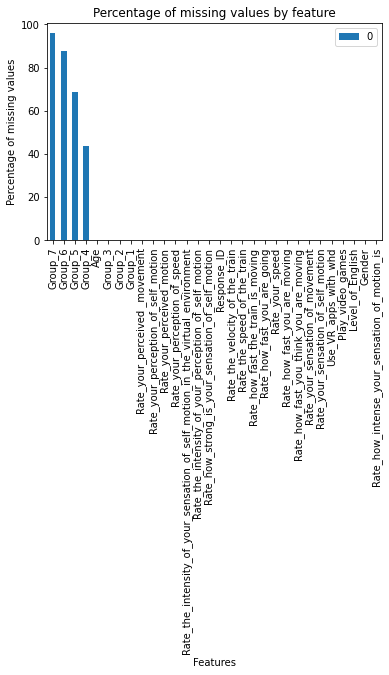

In [14]:
pd.DataFrame(surveyData.isnull().sum()/len(surveyData)*100).nlargest(600,columns=0).plot(kind="bar") 
plt.rcParams["figure.figsize"] = [15, 11] #10,6
plt.title("Percentage of missing values by feature")
plt.xlabel("Features")
plt.ylabel("Percentage of missing values")
plt.tight_layout()



Features that have more than **80%** missing values are deleted , which are **Group 7 and Group 6** , which arent usefull in processing the data.

In [15]:
columns_to_drop=['Group_7']
surveyData.drop(columns_to_drop, axis=1, inplace=True)

In [16]:
columns_to_drop=['Group_6']
surveyData.drop(columns_to_drop, axis=1, inplace=True)

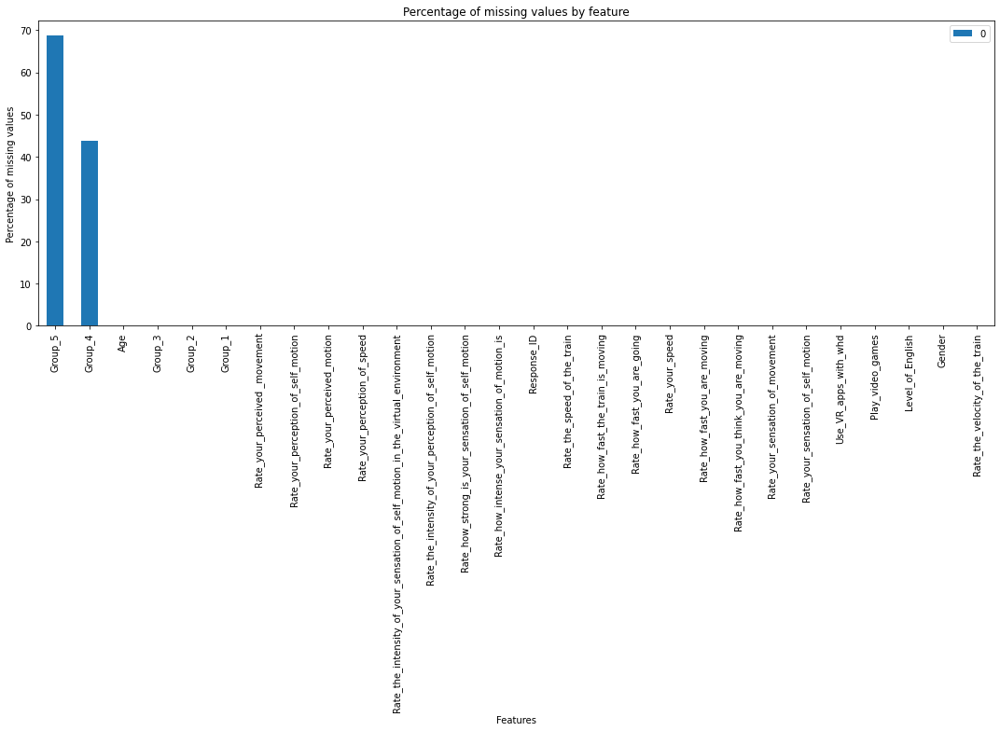

In [17]:
#pd.DataFrame(surveyData.isnull().sum()/len(surveyData)*100).nlargest(5,columns =0).plot(kind="pie",subplots=True) 
#plt.title("Percentage of missing values by feature")
#plt.tight_layout()
pd.DataFrame(surveyData.isnull().sum()/len(surveyData)*100).nlargest(600,columns=0).plot(kind="bar") 
plt.rcParams["figure.figsize"] = [15, 11] #10,6
plt.title("Percentage of missing values by feature")
plt.xlabel("Features")
plt.ylabel("Percentage of missing values")
plt.tight_layout()

We can conclude that the main groups with the participants justification is **Group 1 , Group 2 and Group 3**, that does not have any missing values. 


---



***Removing the null values from Group 4 and Group 5 , the remaining values are used for further processing.***

In [18]:
surveyData.Group_4.dropna(inplace= True)

In [19]:
surveyData.Group_4

0     This group has to do with how your motion make...
3     A mix between group 1 and 2 but doesn't fit in...
6     more about the feeling of motion intensity ins...
7     These sentences are all about my perception of...
8     I grouped these sentences together based on in...
10                       All about the trains movement.
12      it is about how strong your feeling of speed is
16                                    Personal movement
17    describes the extent to which one believes the...
18                    Decision making about train speed
19       asking you be to be subjective about the speed
21                About the intensity of the perception
22                             perpception of intensity
25    Here I am being asked about how intense the fe...
26    Sentences that relate to how a person senses t...
27                                          Self motion
28    Measuring the sensation of the movement rather...
29    Here I am rating the movement I thought to

In [20]:
surveyData.Group_5.dropna(inplace= True)

In [21]:
surveyData.Group_5

0     This group has to do with your understanding o...
3     This is about what movement you're actually fe...
12                           it is about your sensation
16                                                Speed
17                    describes the feeling of movement
18         Decision making about my perception of speed
21    Similar to Group 3 - rating what?  Your percep...
22     perception of own movement, not limited to speed
26    General sentences relating to how a person sen...
27                                                    -
31    quality of the sensation of movement in more g...
32                                   Similar ro group 3
34    Same as 3 but more general to sensing movement...
41     perceived own motion (acknowledges subjectivity)
42    you ask about self-motion here, which is a spe...
Name: Group_5, dtype: object



---


Since the columns of the user Justification i.e. , Group_1 - Group_5 is in the format of an **unstructured data**, Natural Language Processing is used for further processing.


---



***NLP***


---



***Tokenization , Stemming and Removal of Stop words***

In [22]:
from nltk.corpus import stopwords
from nltk.tokenize import RegexpTokenizer
from nltk.stem import PorterStemmer
import pandas as pd
import numpy as np
import nltk
nltk.download('stopwords')

#load tokenizer, stemmer and stop words
tokenizer = RegexpTokenizer(r'\w+')
stemmer = PorterStemmer() 
stop_words = set(stopwords.words('english'))
surveyData.Group_4.dropna(inplace= True)
surveyData.Group_5.dropna(inplace= True)
group1 = surveyData.Group_1
group2 = surveyData.Group_2
group3 = surveyData.Group_3
group4 = surveyData.Group_4
group5 = surveyData.Group_5

#convert values to list of lists (each row becomes a separate list)

TG1 = group1.values.tolist() 
TG2 = group2.values.tolist() 
TG3 = group3.values.tolist() 
TG4 = group4.values.tolist() 
TG5 = group5.values.tolist() 


test =tokens = [tokenizer.tokenize(str(i)) for i in group1]

 #tokenize words in lists
tokens = [tokenizer.tokenize(str(i)) for i in TG1]
tokens1 = [tokenizer.tokenize(str(i)) for i in TG2] 
tokens2 = [tokenizer.tokenize(str(i)) for i in TG3]
tokens3 = [tokenizer.tokenize(str(i)) for i in TG4]
tokens4 = [tokenizer.tokenize(str(i)) for i in TG5] 

Tokens_of_all_groups = tokens+tokens1+tokens2+tokens3+tokens4#+tokens5+tokens6


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


The tokens for all the groups is shown below stored in **Tokens_of_all_groups** , individual participants Justification group tokens for Group 1 - 5 is stored in **tokens, tokens1, tokens2, tokens3, tokens4** respectively.

In [23]:
surveyData['Level_of_English'].value_counts()


C2 - Proficient / Mother tongue    37
C1 (95-120)                         7
B2 (72-94)                          4
Name: Level_of_English, dtype: int64

In [24]:
surveyData['Use_VR_apps_with_whd'].value_counts()

Never           39
Once a month     6
Once a week      3
Name: Use_VR_apps_with_whd, dtype: int64

#**Exploratory Data Analysis**



---


***Identifying the most common phrases used by the participants for classifying the sentences to the differnent groups.***


---



**GROUP** **1** .


---



***Defining a function to convert any sentences to individual words***

In [25]:
def convert(lst): 
    return ' '.join(lst).split() 
      

***Converting the sentences of Group 1 to words and storing in the variable words_of_group1***

In [26]:
words_of_group1 = convert(TG1) 


***Total count of the words are obtained.***

In [27]:
count_of_words = Counter(words_of_group1)
print(count_of_words)

Counter({'the': 45, 'of': 32, 'to': 20, 'speed': 19, 'is': 9, 'about': 9, 'and': 8, 'how': 8, 'you': 8, 'are': 8, 'sentences': 8, 'a': 7, 'I': 7, 'train"': 7, 'fast': 6, 'movement"': 5, 'perception': 5, '"These': 5, 'that': 5, 'train': 5, 'movement': 4, 'all': 4, 'my': 4, 'actual': 4, '"The': 4, 'refer': 4, 'am': 4, '"This': 3, 'group': 3, 'with': 3, '"All': 3, 'based': 3, 'on': 3, 'rate': 3, 'in': 3, 'rating': 3, 'as': 3, 'motion"': 3, 'or': 3, 'which': 3, 'from': 3, 'me': 3, 'do': 2, 'your': 2, 'would': 2, 'physical': 2, 'self': 2, '(3': 2, 'considered': 2, 'personal': 2, 'quantity': 2, 'sensation': 2, 'objective': 2, 'intensity': 2, 'related': 2, 'subjective': 2, '"Here': 2, 'going,': 2, 'train,': 2, 'rather': 2, 'than': 2, 'sensation,': 2, 'ask': 2, 'only"': 2, 'imaginary': 2, 'has': 1, 'train."': 1, '"contains': 1, 'items': 1, 'relating': 1, 'involve': 1, 'velocity,': 1, 'most': 1, 'simple': 1, 'questions"': 1, 'perceive': 1, 'instructions': 1, 'assumption': 1, 'felt': 1, 'realist

***Plotting the bar graph for the 30 most commonly used words by the participants***

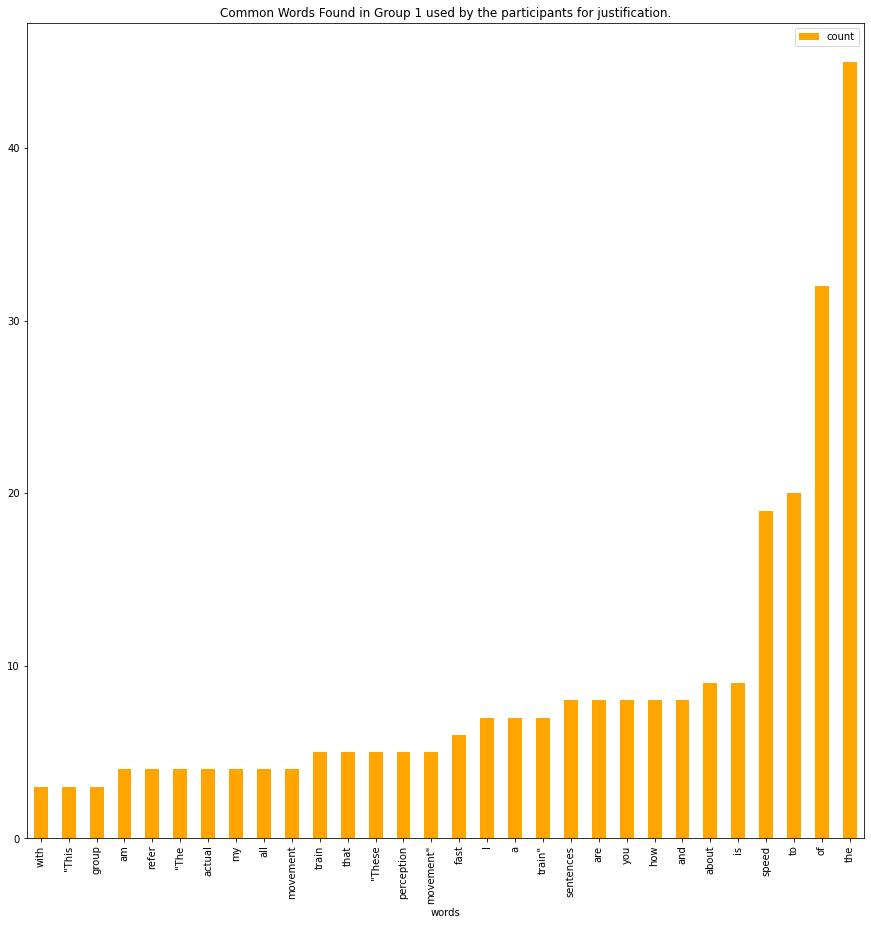

In [28]:
# Takes the Top 30 commonly used words
count_of_words.most_common(30)


words = pd.DataFrame(count_of_words.most_common(30),
                             columns=['words', 'count'])

words.head()

fig, ax = plt.subplots(figsize=(15,15 )) #8,8

# Plot horizontal bar graph
words.sort_values(by='count').plot.bar(x='words',
                      y='count',
                      ax=ax,
                      color="orange")

ax.set_title("Common Words Found in Group 1 used by the participants for justification.")

plt.show()

From the top 30 words , the key words extracted are **Speed** , **Sentences** , **Train** , **fast** , **movement** , **Perception**.

The total word count are :
- **Speed** :19 
- **Sentences** : 8 
- **Train** : 7
- **Fast** : 6 
- **Movement** : 5 
- **Perception** : 5



---




***Grouping all the sentences with these words and checking for the existence of a combination of words.***


---



In [29]:
CoverageACol = np.array(surveyData.Group_1.values)
count =0  
count1 =0
count2 =0
count3 =0
sent_count =0
list1=CoverageACol

list2=["train"] #
list3 =["speed"]
combined =["train","speed"]
sen = ["sentences"]
fa1=["fast"]
movm1 = ["movement"]
percp = ["perception"]
train = []
speed =[]
both =[]
train_speed =[]
sentences = []
fast = []
movement= []
perception = []
for word in list2:
  for phrase in list1:
    if word.lower() in phrase.lower():
      train.append(phrase)
      count = count +1

for word in list3:
  for phrase in list1:
    if word.lower() in phrase.lower():
      speed.append(phrase)
      count1 = count1 +1

for word in combined:
  for phrase in list1:
    if word.lower() in phrase.lower():
      if word.lower() in list2 and list3: 
        both.append(phrase)
        count3 = count3 +1

for word in sen:
  for phrase in list1:
    if word.lower() in phrase.lower():
      sentences.append(phrase)
      sent_count = sent_count +1

for word in fa1:
  for phrase in list1:
    if word.lower() in phrase.lower():
      fast.append(phrase)
      fast_count = sent_count +1

for word in movm1:
  for phrase in list1:
    if word.lower() in phrase.lower():
      movement.append(phrase)
      movm_count = sent_count +1

for word in percp:
  for phrase in list1:
    if word.lower() in phrase.lower():
      perception.append(phrase)
      percep_count = sent_count +1

unique_result = set(train)
print(train)
print(speed)
print("The sentences for both are :",both)
print("The sentences with sentences ",sentences)
#print(unique_result)
print("Train Count :",count)
print("Speed Count",count1)
print("both parases Count",count3)
print("sentences count",sent_count)
print("fast count",fast_count)
print("movement count",movm_count)
print("perception count",percep_count)

['"This group has to do with the speed of the train."', '"The first group refers to all the sentences relative to the actual speed of the train"', '"To do with the speed of the train"', '"It is related to the train" ', '"Contains sentences that refer to how a person perceives the movement of the train"', '"The speed of the train"', '"Related to my feelings of the train, rather than myself"', '"quality of the speed of the train"', '"Asking what speed the train is going"', '"Train only"', '"perceived speed of train  (acknowledges subjectivity)"', '"These sentences are about how fast the observer thinks the train is moving."', '"Quantifies the speed of the train"', '"Imaginary movement of the imaginary me and imaginary train which are the same"', '"rating the train, describing the train only"']
['"This group has to do with the speed of the train."', '"contains items relating to speed of movement"', '"All involve speed and velocity, most simple questions"', '"These instructions are based o



---

***Extracting Sentences for all the keywords of a particular group***

---



In [30]:
speed

['"This group has to do with the speed of the train."',
 '"contains items relating to speed of movement"',
 '"All involve speed and velocity, most simple questions"',
 '"These instructions are based on the assumption that you felt a realistic sense of motion and they are asking you to rate the speed of that movement the same way you would in a real world scenario."',
 '"These sentences are all about my own speed"',
 '"I grouped them based on actual speed of the self (3 sentences) and the vehicle (3 sentences). I considered actual speed as the main category here, then considered two sub categories as the actual speed of the self and the vehicle."',
 '"The first group refers to all the sentences relative to the actual speed of the train"',
 '"All about personal speed."',
 '"These sentences would refer to concrete facts. The speed and velocity are measurable."',
 '"To do with the speed of the train"',
 '"quasi-objective measure of speed i am travelling"',
 '"The speed of the train"',
 '"M

In [31]:
sentences

['"These sentences are all about my own speed"',
 '"I grouped them based on actual speed of the self (3 sentences) and the vehicle (3 sentences). I considered actual speed as the main category here, then considered two sub categories as the actual speed of the self and the vehicle."',
 '"The first group refers to all the sentences relative to the actual speed of the train"',
 '"These sentences would refer to concrete facts. The speed and velocity are measurable."',
 '"Contains sentences that refer to how a person perceives the movement of the train"',
 '"All sentences refer to the perception of self-motion"',
 '"These sentences describe a command to subjectively evaluate how fast you are going. All sentences ask you how fast you are going, from your subjective perspective."',
 '"These sentences are about how fast the observer thinks the train is moving."']

In [32]:
train

['"This group has to do with the speed of the train."',
 '"The first group refers to all the sentences relative to the actual speed of the train"',
 '"To do with the speed of the train"',
 '"It is related to the train" ',
 '"Contains sentences that refer to how a person perceives the movement of the train"',
 '"The speed of the train"',
 '"Related to my feelings of the train, rather than myself"',
 '"quality of the speed of the train"',
 '"Asking what speed the train is going"',
 '"Train only"',
 '"perceived speed of train  (acknowledges subjectivity)"',
 '"These sentences are about how fast the observer thinks the train is moving."',
 '"Quantifies the speed of the train"',
 '"Imaginary movement of the imaginary me and imaginary train which are the same"',
 '"rating the train, describing the train only"']

In [33]:
fast

['"The quantity of the "fastness"."',
 '"Here I am being asked to estimate how fast I am going, which is my estimation of some objective fact"',
 '"They all included the word fast and seems to be based on personal judgement"',
 '"These sentences describe a command to subjectively evaluate how fast you are going. All sentences ask you how fast you are going, from your subjective perspective."',
 '"These sentences are about how fast the observer thinks the train is moving."',
 '"Asked to rate how fast I was moving, at least from the point of view shown in the video"']

In [34]:
movement

['"contains items relating to speed of movement"',
 '"This is about how you perceive your perception of movement"',
 '"These instructions are based on the assumption that you felt a realistic sense of motion and they are asking you to rate the speed of that movement the same way you would in a real world scenario."',
 '"Actual movement"',
 '"Perception of movement"',
 '"they refer to perception/sensation of movement. It\'s the subjective perception of something happening external to me."',
 '"Contains sentences that refer to how a person perceives the movement of the train"',
 '"Measuring perceived speed and movement"',
 '"Here I am rating my hability to assess the movement that is occurring"',
 '"Imaginary movement of the imaginary me and imaginary train which are the same"']

In [35]:
perception

['"This is about how you perceive your perception of movement"',
 '"More about feeling/perception of the whole environment." ',
 '"Personal perception of motion"',
 '"Decision-making about physical strength (intensity) of sensation or perception"',
 '"Perception of movement"',
 '"they refer to perception/sensation of movement. It\'s the subjective perception of something happening external to me."',
 '"All sentences refer to the perception of self-motion"',
 '"This group relates to sensation, which I think is subtly different from perception. For me these all ask me to rate how much it \'feels\' as though I\'m moving- the intensity of that sensation, rather than the speed itself."',
 '"The question is about speed either mine or a generic perception (not contextualised)"']

In [36]:
both

['"This group has to do with the speed of the train."',
 '"The first group refers to all the sentences relative to the actual speed of the train"',
 '"To do with the speed of the train"',
 '"It is related to the train" ',
 '"Contains sentences that refer to how a person perceives the movement of the train"',
 '"The speed of the train"',
 '"Related to my feelings of the train, rather than myself"',
 '"quality of the speed of the train"',
 '"Asking what speed the train is going"',
 '"Train only"',
 '"perceived speed of train  (acknowledges subjectivity)"',
 '"These sentences are about how fast the observer thinks the train is moving."',
 '"Quantifies the speed of the train"',
 '"Imaginary movement of the imaginary me and imaginary train which are the same"',
 '"rating the train, describing the train only"']

- **31.25%** of the participants have used the phase **train** in the sentences for justification of Group 1.
- **39.58%** of the users have used the phrase **speed** in the sentences for justification under group 1.
- **31.25 %** of the participants have used the phases "**Train**" and "**Speed**" together in the setences to classify under Group 1 which corressponds to the speed of the train.
- **17 %** of the participant has used the word **"Sentences"** for justification of Group 1 
- **19 %** of the participants has used the words **"Fast"** , **Movement , Perception** for justification of Group 1 

***Estimating Cosine Similarity***


---



In [37]:
# Scikit Learn
from sklearn.feature_extraction.text import CountVectorizer
import pandas as pd

# Estimating the cosine similarity for the phrase "Speed of the train"
count_vectorizer = CountVectorizer(stop_words='english')
count_vectorizer = CountVectorizer()
sparse_matrix = count_vectorizer.fit_transform(both)
from sklearn.metrics.pairwise import cosine_similarity
cosine_similarity(sparse_matrix[0:1], sparse_matrix)


array([[1.        , 0.70891756, 0.87705802, 0.45291081, 0.50128041,
        0.73379939, 0.43852901, 0.66899361, 0.41931393, 0.19611614,
        0.33968311, 0.35805744, 0.68640647, 0.36313652, 0.50174521]])



---


**GROUP 2** .


---



***Converting the sentences of Group 2 to words and storing in the variable words_of_group1***

In [38]:
words_of_group2 = convert(TG2) 

***Total count of the words are obtained.***

In [39]:
count_of_words1 = Counter(words_of_group2)
print(count_of_words1)

Counter({'the': 30, 'of': 24, 'to': 17, 'about': 13, 'how': 12, 'I': 12, 'speed': 12, 'movement': 11, 'is': 11, 'are': 10, 'you': 8, 'fast': 8, 'sentences': 7, 'your': 6, 'train': 6, 'and': 6, 'These': 6, 'a': 6, 'or': 6, 'sensation': 6, 'my': 6, 'own': 5, 'all': 5, 'This': 4, 'what': 4, 'moving': 4, 'rating': 4, 'feeling': 4, 'refer': 4, 'motion': 4, 'like': 4, 'group': 3, 'think': 3, 'All': 3, 'The': 3, 'this': 3, 'It': 3, 'refers': 3, 'perceived': 3, 'actual': 3, 'intensity': 3, 'it': 3, 'objective': 3, 'not': 3, 'going': 3, 'with': 2, 'perception': 2, 'answer': 2, '(Group': 2, 'was': 2, 'in': 2, 'more': 2, 'motion.': 2, 'relative': 2, 'specific': 2, 'level': 2, 'Perception': 2, "you're": 2, 'should': 2, 'self': 2, 'subjective': 2, 'How': 2, 'perceive': 2, 'they': 2, 'Here': 2, 'am': 2, 'which': 2, 'that': 2, "I'm": 2, 'movement,': 2, 'felt': 2, 'for': 2, 'so': 2, 'thought': 2, 'rather': 2, 'than': 2, 'feels': 2, 'Personal': 2, 'ask': 2, '"you"': 2, 'moving,': 2, 'moving.': 2, 'has'

***Plotting the bar graph for the 30 most commonly used words by the participants***

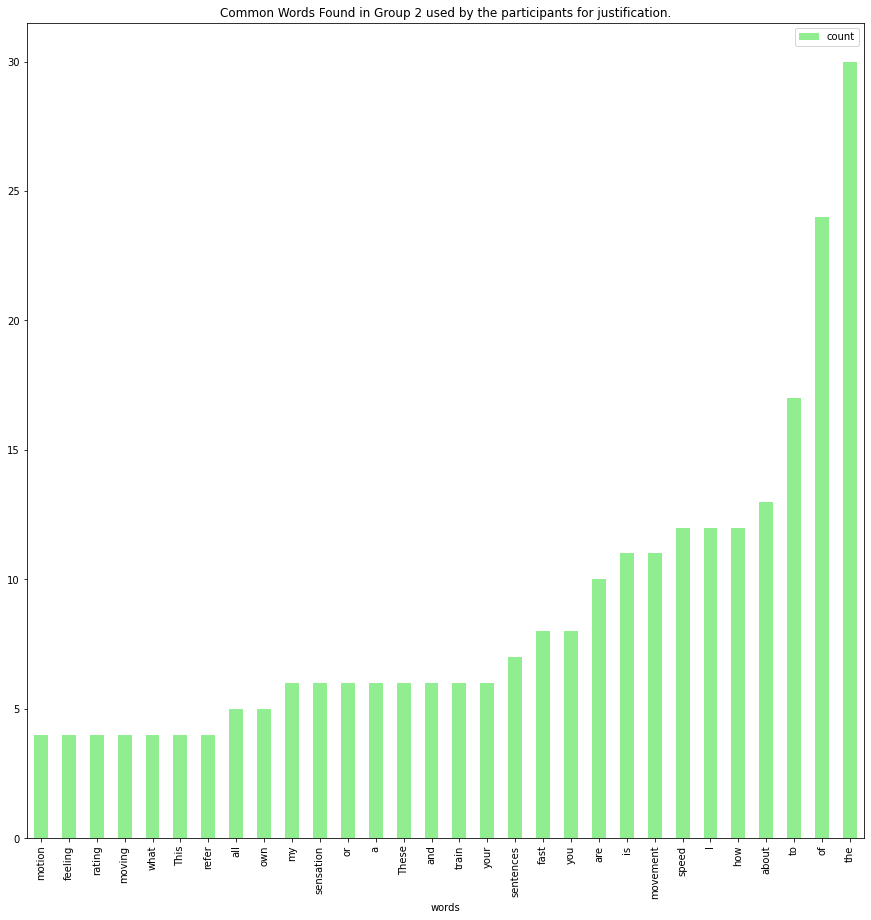

In [40]:
count_of_words1.most_common(30)


words = pd.DataFrame(count_of_words1.most_common(30),
                             columns=['words', 'count'])

words.head()

fig, ax = plt.subplots(figsize=(15,15 )) #8,8

# Plot horizontal bar graph
words.sort_values(by='count').plot.bar(x='words',
                      y='count',
                      ax=ax,
                      color="lightgreen")

ax.set_title("Common Words Found in Group 2 used by the participants for justification.")

plt.show()

From the **top 30 words** , the **key words extracted** are **Speed** , **Movement** ,**fast**,**Sentences**,**Train** , **sensation**.

The total word count are :

- **Speed** :12
- **Movement** : 11
- **Fast** : 8
- **Sentences** : 7
- **Train** : 6
- **Sensation** : 6 



---


**GROUP 3** .


---



***Converting the sentences of Group 3 to words and storing in the variable words_of_group3***

In [41]:
words_of_group3 = convert(TG3) 

***Total count of the words are obtained.***

In [42]:
count_of_words2 = Counter(words_of_group3)
print(count_of_words2)

Counter({'the': 34, 'of': 28, 'to': 19, 'speed': 13, 'how': 11, 'is': 11, 'about': 11, 'train': 9, 'your': 8, 'you': 8, 'movement': 8, 'perception': 7, 'I': 7, 'my': 7, 'in': 6, 'a': 6, 'are': 6, 'sensation': 6, 'This': 5, 'own': 5, 'moving': 5, 'These': 5, 'and': 5, 'sentences': 5, 'with': 4, 'All': 4, 'all': 4, 'rate': 4, 'not': 4, 'refer': 4, 'but': 4, 'group': 3, 'be': 3, 'feeling': 3, 'ask': 3, 'or': 3, 'The': 3, '-': 3, 'also': 3, 'as': 3, 'they': 3, 'than': 3, 'rating': 3, 'quality': 3, 'related': 3, 'me': 3, 'asked': 3, 'which': 3, 'motion': 3, "I'm": 3, 'fast': 3, 'do': 2, 'what': 2, 'actually': 2, 'items': 2, 'it': 2, 'feels': 2, 'perception,': 2, 'mind': 2, 'passing,': 2, 'sensation,': 2, 'i.e.': 2, 'virtual': 2, 'train,': 2, 'environment': 2, 'together': 2, 'both': 2, 'rather': 2, 'actual': 2, 'perceive': 2, 'movement.': 2, 'whatever': 2, 'feelings': 2, 'subjective': 2, 'objective': 2, 'perception?': 2, 'It': 2, 'something': 2, 'Here': 2, 'am': 2, 'being': 2, 'THE': 2, 'at'

***Plotting the bar graph for the 30 most commonly used words by the participants***

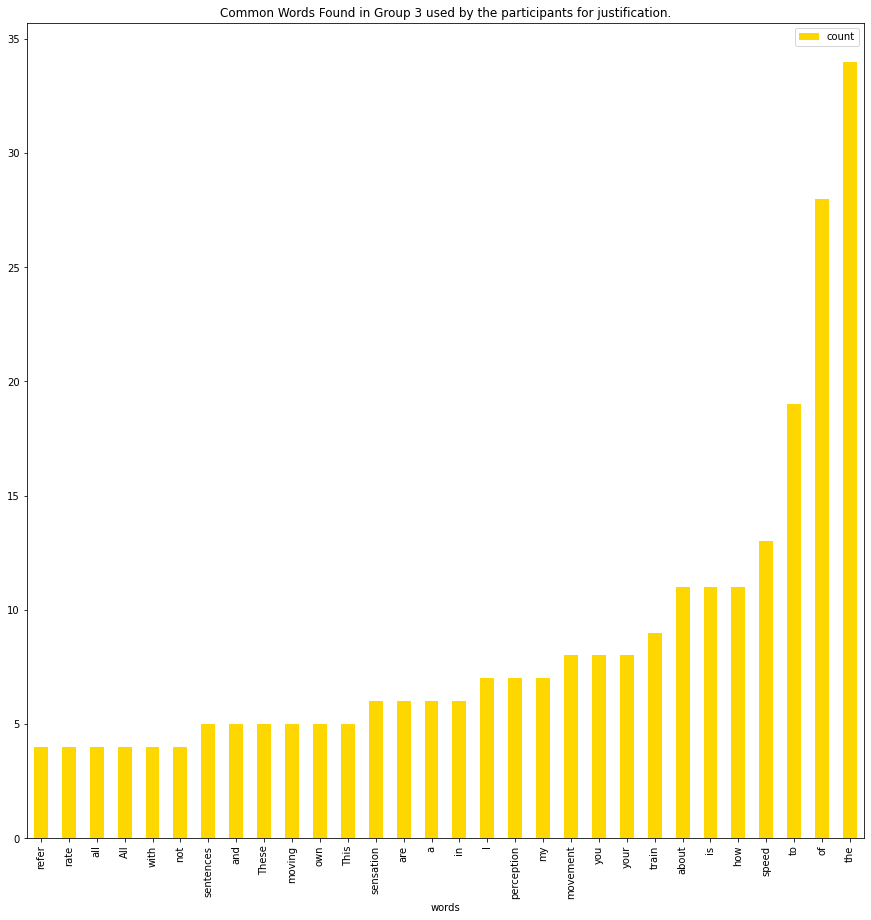

In [43]:
count_of_words2.most_common(30)


words = pd.DataFrame(count_of_words2.most_common(30),
                             columns=['words', 'count'])

words.head()

fig, ax = plt.subplots(figsize=(15,15 )) #8,8

# Plot horizontal bar graph
words.sort_values(by='count').plot.bar(x='words',
                      y='count',
                      ax=ax,
                      color="gold")

ax.set_title("Common Words Found in Group 3 used by the participants for justification.")

plt.show()

From the **top 30 words** , the key words extracted are **Speed** , **Train** , **movement** , **Perception**,**Sensation**.

The total word count are :

- **Speed** :12
- **Train** :
- **Movement** : 11
- **Perception** : 8
- **Sensation** : 6

*Obtaining the feature count and the numeric vector representation of user justifications for* **GROUP 4** .


---



***Converting the sentences of Group 4 to words and storing in the variable words_of_group4***

In [44]:
words_of_group4 = convert(TG4) 

***Total count of the words are obtained.***

In [45]:
count_of_words3 = Counter(words_of_group4)
print(count_of_words3)

Counter({'to': 16, 'the': 16, 'of': 15, 'about': 11, 'is': 11, 'speed': 9, 'motion': 8, 'you': 8, 'how': 7, 'I': 5, 'it': 5, 'be': 5, 'A': 4, 'intensity': 4, 'sentences': 4, 'my': 4, 'own': 4, 'movement': 4, 'moving': 4, 'from': 4, 'group': 3, 'your': 3, 'and': 3, 'but': 3, 'in': 3, 'sensation': 3, 'train': 3, 'asking': 3, 'that': 3, 'a': 3, 'ask': 3, 'This': 2, 'do': 2, 'with': 2, '1': 2, 'either': 2, 'feeling': 2, 'These': 2, 'all': 2, 'perception': 2, 'refer': 2, 'or': 2, 'All': 2, 'which': 2, 'Here': 2, 'am': 2, 'rather': 2, 'than': 2, 'rating': 2, 'as': 2, 'Group': 2, '-': 2, 'this': 2, 'what': 2, 'B.': 2, 'has': 1, 'makes': 1, 'feel.': 1, 'mix': 1, 'between': 1, '2': 1, "doesn't": 1, 'fit': 1, 'more': 1, 'instead': 1, 'are': 1, 'grouped': 1, 'these': 1, 'together': 1, 'based': 1, 'on': 1, 'intensity.': 1, 'Each': 1, 'them': 1, 'terms': 1, 'perception.': 1, 'trains': 1, 'movement.': 1, 'strong': 1, 'Personal': 1, 'describes': 1, 'extent': 1, 'one': 1, 'believes': 1, 'themselves': 

***Plotting the bar graph for the 30 most commonly used words by the participants***

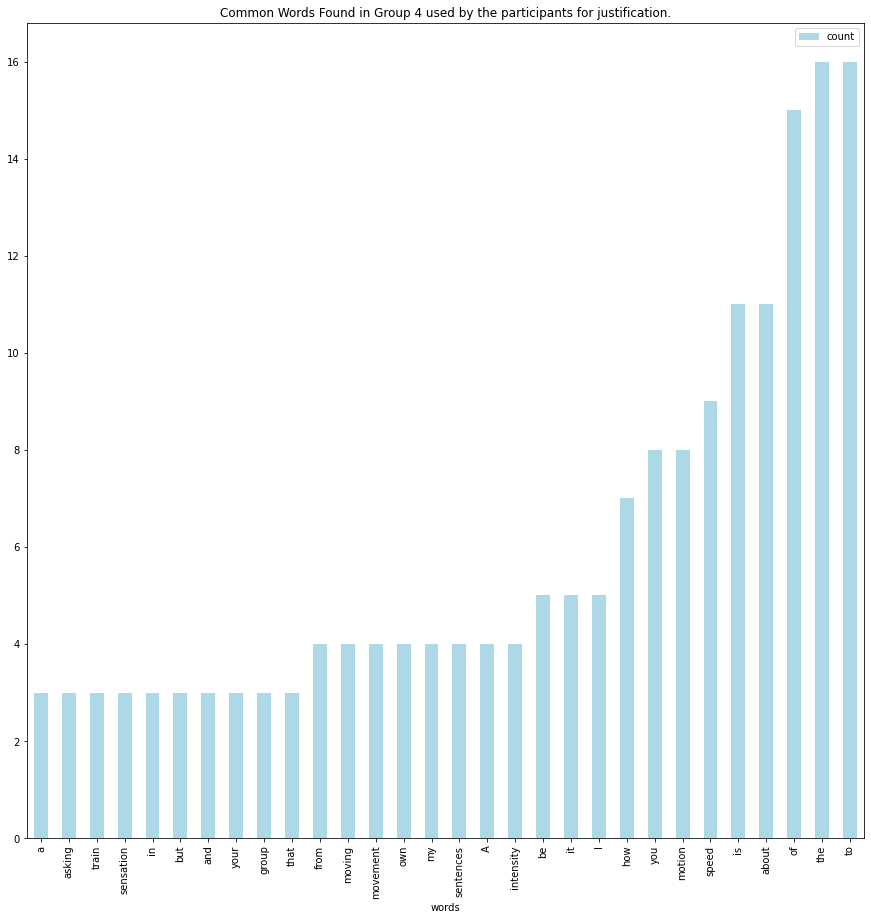

In [46]:
# Takes the Top 30 commonly used words
count_of_words3.most_common(30)


words = pd.DataFrame(count_of_words3.most_common(30),
                             columns=['words', 'count'])

words.head()

fig, ax = plt.subplots(figsize=(15,15 )) #8,8

# Plot horizontal bar graph
words.sort_values(by='count').plot.bar(x='words',
                      y='count',
                      ax=ax,
                      color="lightblue")

ax.set_title("Common Words Found in Group 4 used by the participants for justification.")

plt.show()

From the **top 30 words** , the key words extracted are **Speed** ,**Motion**,**intensity** ,**sentences** ,**movement**.

The total word count are :

- **Speed** :9
- **Motion** : 8
- **Intensity** : 4
- **Sentences** : 4
- **Movement** : 4

*Obtaining the feature count and the numeric vector representation of user justifications for* **GROUP 5** .

***Converting the sentences of Group 5 to words and storing in the variable words_of_group5***

In [ ]:
words_of_group5 = convert(TG5)

***Total count of the words are obtained.***

In [ ]:
count_of_words5 = Counter(words_of_group5)
print(count_of_words5)

Counter({'of': 10, 'to': 6, 'is': 4, 'about': 4, 'movement': 4, 'perception': 4, 'This': 3, 'motion': 3, '3': 3, 'group': 2, 'your': 2, 'in': 2, 'feeling': 2, 'sensation': 2, 'the': 2, 'speed': 2, 'Similar': 2, 'Group': 2, '-': 2, 'own': 2, 'a': 2, 'more': 2, 'general': 2, 'be': 2, 'as': 2, 'has': 1, 'do': 1, 'with': 1, 'understanding': 1, 'overall,': 1, 'irrespective': 1, 'what,': 1, 'particular,': 1, 'moving.': 1, 'what': 1, "you're": 1, 'actually': 1, 'it': 1, 'Speed': 1, 'describes': 1, 'Decision': 1, 'making': 1, 'my': 1, 'rating': 1, 'what?': 1, 'Your': 1, 'movement?': 1, 'Ambiguous': 1, 'movement,': 1, 'not': 1, 'limited': 1, 'General': 1, 'sentences': 1, 'relating': 1, 'how': 1, 'person': 1, 'senses': 1, 'quality': 1, 'terms': 1, 'than': 1, '3,': 1, 'i.e.': 1, 'can': 1, 'self': 1, 'or': 1, 'just': 1, 'train': 1, 'an': 1, 'object': 1, 'ro': 1, 'Same': 1, 'but': 1, 'sensing': 1, 'train.': 1, 'perceived': 1, '(acknowledges': 1, 'subjectivity)': 1, 'you': 1, 'ask': 1, 'self-motion'

***Plotting the bar graph for the 30 most commonly used words by the participants***

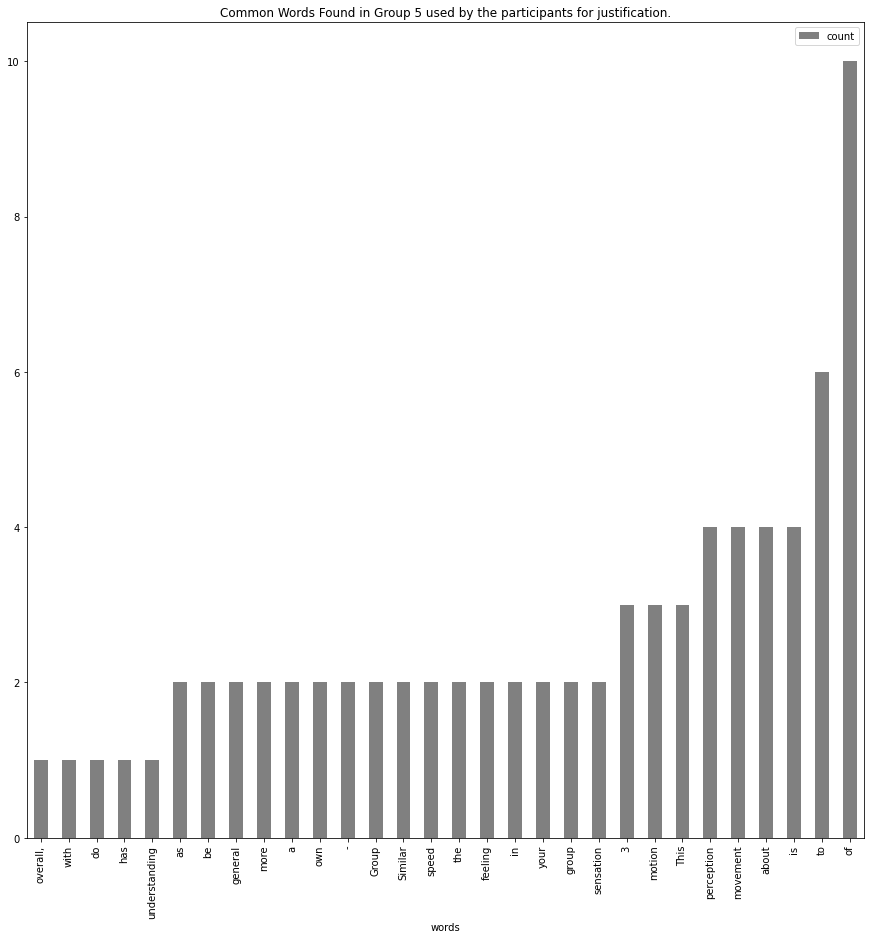

In [ ]:
# Takes the Top 30 commonly used words
count_of_words5.most_common(30)


words = pd.DataFrame(count_of_words5.most_common(30),
                             columns=['words', 'count'])

words.head()

fig, ax = plt.subplots(figsize=(15,15 )) #8,8

# Plot horizontal bar graph
words.sort_values(by='count').plot.bar(x='words',
                      y='count',
                      ax=ax,
                      color="grey")

ax.set_title("Common Words Found in Group 5 used by the participants for justification.")

plt.show()

From the **top 30 words** , the key words extracted are **Movement** ,**Perception**,**3** ,**motion** ,**sensation**.

The total word count are :

- **Movement** :4
- **Perception** : 4
- **3** : 3
- **motion** : 3
- **Sensation** : 2

**Sentences Similarity**


---



***Using python library Sequence Matcher to find similarity between two sentences , a value above and equal to 0.60 indicates that the sentences are similar.***

User's justification comments for **Group 1**

In [47]:
from difflib import SequenceMatcher

def Similar(a,b):
  return SequenceMatcher(None, a, b).ratio()


col_list = [23]
df = pd.read_csv("results-survey173122.csv", usecols=col_list)
#df.astype(str)
#df
rows = len(df)


CoverageACol = np.array(df.values)
CoverageACol
for val in range(47):
  str1 = CoverageACol[val,0]
  #print(str1)
  str2 = CoverageACol[val+1,0]
  #print(str2)
  if val <= 47:
    a= Similar(str1,str2)
    if a >= 0.60:
      print(a)
      #print(CoverageACol[val,0])
      print(str1)
      print(str2)


0.6122448979591837
"Perceived motion"
"Personal perception of motion"


User's justification comments for **Group 2**

In [48]:
from difflib import SequenceMatcher

def Similar(a,b):
  return SequenceMatcher(None, a, b).ratio()


col_list = [24]
df = pd.read_csv("results-survey173122.csv", usecols=col_list)
#df.astype(str)
#df
rows = len(df)


CoverageACol = np.array(df.values)
CoverageACol
for val in range(47):
  str1 = CoverageACol[val,0]
  #print(str1)
  str2 = CoverageACol[val+1,0]
  #print(str2)
  if val <= 47:
    a= Similar(str1,str2)
    if a >= 0.40:
      print(a)
      #print(CoverageACol[val,0])
      print(str1)
      print(str2)

0.42276422764227645
The subject is train - more about the speed of the train itself
These senstences are all about my perception of my own speed
0.4205128205128205
These senstences are all about my perception of my own speed
These sentences belong to the category 'perception'. Each sentence refers to perceived movement or motion, as opposed to actual motion.
0.4731182795698925
It is related to our sensation and movement
they refer to the objective movement of the train.


User's justification comments for **Group 3**

In [49]:
from difflib import SequenceMatcher

def Similar(a,b):
  return SequenceMatcher(None, a, b).ratio()


col_list = [25]
df = pd.read_csv("results-survey173122.csv", usecols=col_list)
#df.astype(str)
#df
rows = len(df)


CoverageACol = np.array(df.values)
CoverageACol
for val in range(47):
  str1 = CoverageACol[val,0]
  #print(str1)
  str2 = CoverageACol[val+1,0]
  #print(str2)
  if val <= 47:
    a= Similar(str1,str2)
    #if a >= 0.60:
    print(a)
      #print(CoverageACol[val,0])
    print(str1)
    print(str2)

0.2727272727272727
This group has to do with what your own speed actually is.
contains items relating to how it feels to be moving
0.208955223880597
contains items relating to how it feels to be moving
All involve perception, how your mind is analyzing all factors (rate of tracks passing, rate of walls passing, end of tunnel not getting closer, etc)
0.15463917525773196
All involve perception, how your mind is analyzing all factors (rate of tracks passing, rate of walls passing, end of tunnel not getting closer, etc)
This group is about the intensity of feeling 
0.3194444444444444
This group is about the intensity of feeling 
These items ask you to rate your sensation, i.e. whether your sensations were realistic or intense.
0.3841059602649007
These items ask you to rate your sensation, i.e. whether your sensations were realistic or intense.
It's about your perception itself in a virtual space
0.34444444444444444
It's about your perception itself in a virtual space
The subject is myself 

***Estimating sentences similarity using cosine similarity***

***For Group 1 and Group 2***


---



In [50]:
import math
import re
from collections import Counter

WORD = re.compile(r"\w+")


def get_cosine(vec1, vec2):
    intersection = set(vec1.keys()) & set(vec2.keys())
    numerator = sum([vec1[x] * vec2[x] for x in intersection])

    sum1 = sum([vec1[x] ** 2 for x in list(vec1.keys())])
    sum2 = sum([vec2[x] ** 2 for x in list(vec2.keys())])
    denominator = math.sqrt(sum1) * math.sqrt(sum2)

    if not denominator:
        return 0.0
    else:
        return float(numerator) / denominator


def text_to_vector(text):
    words = WORD.findall(text)
    return Counter(words)



col_list = [24,25]
df = pd.read_csv("results-survey173122.csv", usecols=col_list)
#df.astype(str)
#df
rows = len(df)


CoverageACol = np.array(df.values)
CoverageACol
for val in range(47):
  str1 = CoverageACol[val,0]
  #print(str1)
  str2 = CoverageACol[val+1,0]
  #print(str2)
  if val <= 47:
    vector1 = text_to_vector(str1)
    print("Vec 1",vector1)
    vector2 = text_to_vector(str2)
    print("vec2" ,vector2)
    cosine = get_cosine(vector1, vector2)
    print("Cosine:", cosine)



Vec 1 Counter({'This': 1, 'group': 1, 'has': 1, 'to': 1, 'do': 1, 'with': 1, 'what': 1, 'you': 1, 'think': 1, 'about': 1, 'your': 1, 'own': 1, 'speed': 1})
vec2 Counter({'contains': 1, 'items': 1, 'relating': 1, 'to': 1, 'perception': 1, 'of': 1, 'movement': 1})
Cosine: 0.10482848367219183
Vec 1 Counter({'contains': 1, 'items': 1, 'relating': 1, 'to': 1, 'perception': 1, 'of': 1, 'movement': 1})
vec2 Counter({'All': 1, 'involve': 1, 'sensation': 1, 'how': 1, 'the': 1, 'video': 1, 'makes': 1, 'you': 1, 'feel': 1})
Cosine: 0.0
Vec 1 Counter({'All': 1, 'involve': 1, 'sensation': 1, 'how': 1, 'the': 1, 'video': 1, 'makes': 1, 'you': 1, 'feel': 1})
vec2 Counter({'are': 2, 'The': 1, 'train': 1, 'and': 1, 'I': 1, 'one': 1, 'this': 1, 'is': 1, 'about': 1, 'how': 1, 'fast': 1, 'we': 1, 'moving': 1})
Cosine: 0.08333333333333333
Vec 1 Counter({'are': 2, 'The': 1, 'train': 1, 'and': 1, 'I': 1, 'one': 1, 'this': 1, 'is': 1, 'about': 1, 'how': 1, 'fast': 1, 'we': 1, 'moving': 1})
vec2 Counter({'is':

In [51]:
# Scikit Learn
from sklearn.feature_extraction.text import CountVectorizer
import pandas as pd

# Create the Document Term Matrix
count_vectorizer = CountVectorizer(stop_words='english')
count_vectorizer = CountVectorizer()
sparse_matrix = count_vectorizer.fit_transform(group1)
# Similarity between the first document (“Alpine snow winter boots”) with each of the other documents of the set:
from sklearn.metrics.pairwise import cosine_similarity
cosine_similarity(sparse_matrix[0:1], sparse_matrix)


array([[1.        , 0.31448545, 0.09805807, 0.1754116 , 0.38096966,
        0.0836242 , 0.2941742 , 0.09805807, 0.48891771, 0.70891756,
        0.13867505, 0.52414242, 0.        , 0.        , 0.30769231,
        0.        , 0.13867505, 0.10482848, 0.0877058 , 0.43852901,
        0.16012815, 0.87705802, 0.20965697, 0.45291081, 0.34698896,
        0.12403473, 0.50128041, 0.73379939, 0.12403473, 0.24019223,
        0.43852901, 0.66899361, 0.36980013, 0.36980013, 0.41931393,
        0.22237479, 0.        , 0.        , 0.41344912, 0.19611614,
        0.04331481, 0.33968311, 0.24019223, 0.35805744, 0.68640647,
        0.3721042 , 0.36313652, 0.50174521]])



---


**Correlations**


---



**Relation between sentences** : works if all the sentences can be compared at once

***Generating heatmap to find the correlation between the sentences***

In [52]:
test = surveyData

In [53]:
columns_to_drop=['Age', 'Gender', 'Level_of_English', 'Play_video_games', 'Use_VR_apps_with_whd']
test.drop(columns_to_drop, axis=1, inplace=True)

In [54]:
columns_to_drop=['Group_1', 'Group_2', 'Group_3', 'Group_4', 'Group_5', ]
test.drop(columns_to_drop, axis=1, inplace=True)

In [55]:
columns_to_drop=['Response_ID']
test.drop(columns_to_drop, axis=1, inplace=True)

In [56]:
test.head()

,Rate_your_sensation_of_self_motion,Rate_your_sensation_of_movement,Rate_how_fast_you_think_you_are_moving,Rate_how_fast_you_are_moving,Rate_your_speed,Rate_how_fast_you_are_going,Rate_how_fast_the_train_is_moving,Rate_the_speed_of_the_train,Rate_the_velocity_of_the_train,Rate_how_intense_your_sensation_of_motion_is,Rate_how_strong_is_your_sensation_of_self_motion,Rate_the_intensity_of_your_perception_of_self_motion,Rate_the_intensity_of_your_sensation_of_self_motion_in_the_virtual_environment,Rate_your_perception_of_speed,Rate_your_perceived_motion,Rate_your_perception_of_self_motion,Rate_your_perceived _movement
0,4,4,2,3,3,3,1,1,1,4,4,2,4,5,2,2,2
1,3,3,2,1,1,1,1,1,1,3,3,2,3,2,2,2,2
2,2,2,3,1,1,1,1,1,1,2,2,3,2,3,3,3,3
3,5,5,2,2,2,2,2,2,2,3,3,3,3,4,1,1,1
4,2,2,1,1,1,1,1,1,1,3,3,3,3,2,2,2,2


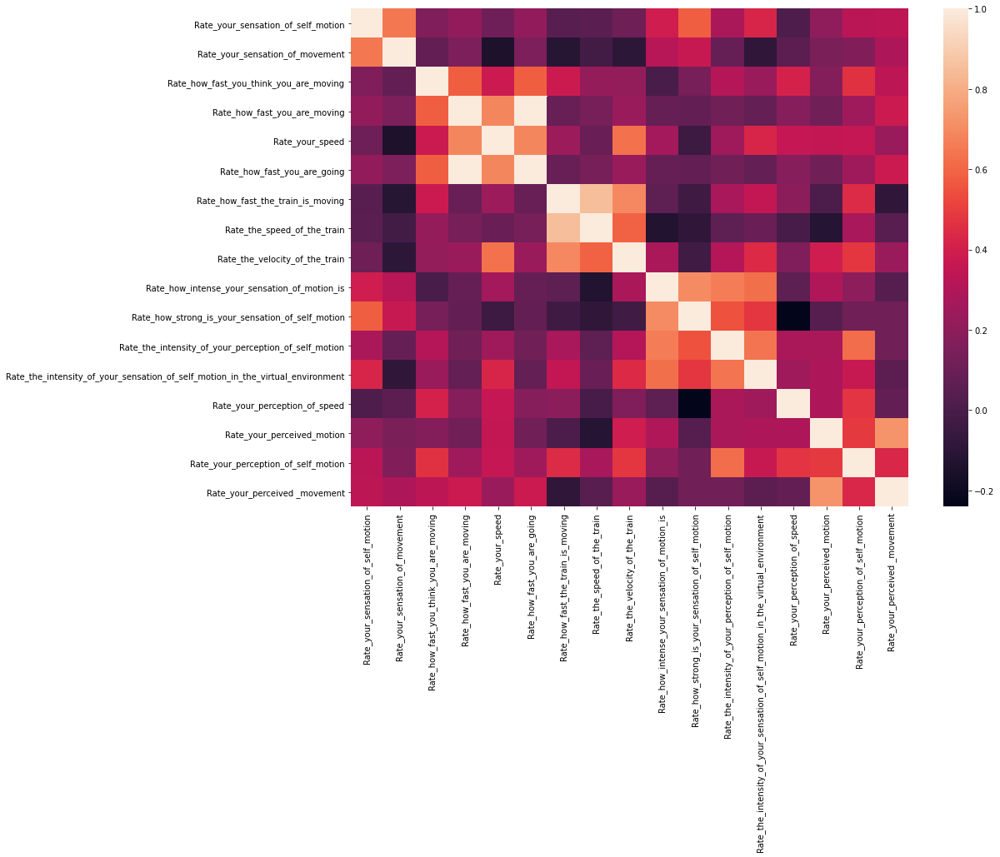

In [57]:
corr = test.corr()
hmap=sns.heatmap(corr)
hmap.figure.savefig("Correlation_Heatmap_with_Seaborn.png",
                    format='png',
                    dpi=150)




# **DATA VISUALIZATION**

***QUESTIONS ASKED TO THE USER TO UNDERSTAND THEIR PERSPECTIVE FOR CLASSIFICATION***

*The Y -axis of the bar graph represents the group numbers of the user's classification for each of the questions*. For each of the questions we calculate what percent of the users have used which group and on what basis have they selected it.

**Q : Rate your sensation of self motion**

**Q : Rate_your_sensation_of_movement**



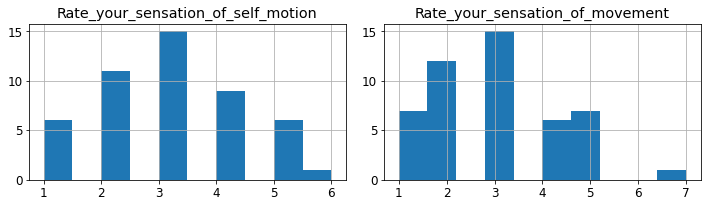

In [ ]:
columns_to_plot = ['Rate_your_sensation_of_self_motion', 'Rate_your_sensation_of_movement']
fig = plt.figure(figsize=(10,8))
for i, column in enumerate(columns_to_plot):
    ax = fig.add_subplot(3,2,i+1)
    surveyData[column].hist(bins=10,ax=ax)
    ax.set_title(column)
fig.tight_layout()
plt.show()



As per the analysis it it noticed that for the question related to **" Rating the sensation of self motion "** 
- **31%** of the users selected **Group 3** 
- **22 %** of the users selected **Group 2**
- **19 %** of the users selected **Group 4** 

For the question related **' Rate_your_sensation_of_movement '**
- **31%** of the users selected **Group 3**
- **25%** of the users selected **Group 2**
- **14%** of the users selected **Group 5**



---


**For the next four questions** , majority of the users have classified under **Group 1 and Group 2.**


---



**Q : Rate_how_fast_you_think_you_are_moving**

**Q : Rate_how_fast_you_are_moving**

**Q : Rate_your_speed , Rate_how_fast_you_are_going**    

**Q : Rate_how_fast_the_train_is_moving**

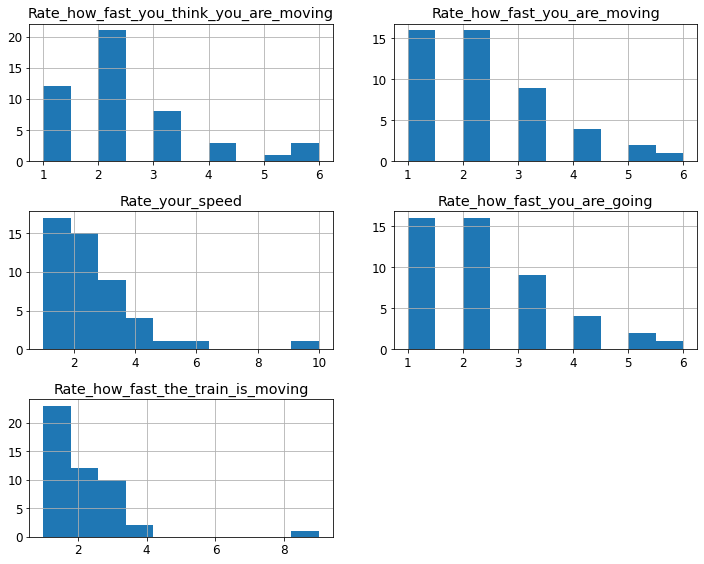

In [ ]:
columns_to_plot = ['Rate_how_fast_you_think_you_are_moving', 'Rate_how_fast_you_are_moving', 
                   'Rate_your_speed', 'Rate_how_fast_you_are_going', 'Rate_how_fast_the_train_is_moving']
fig = plt.figure(figsize=(10,8))
for i, column in enumerate(columns_to_plot):
#    ax = fig.add_subplot(3,3,i+1)
    ax = fig.add_subplot(3,2,i+1)

    listings[column].hist(bins=10,ax=ax)
    ax.set_title(column)
fig.tight_layout()
plt.show()                   

For the question **Rate_how_fast_you_think_you_are_moving**: 
- **44%** of the users classified under **Group 2**
- **25%** of the users classified under **Group 1**
- **17%** of the users classified under **Group 3**

For the question **Rate_how_fast_you_are_moving**:
- **33%** of the users choose **Group 2** and **Group 1**
- **19%** of the users choose **Group 3** 

For the question **Rate_your_speed** : 
- **35%** of the users selected **Group 1**
- **31%** of the users  selected **Group 2**

For the question **Rate_how_fast_you_are_going** : 
- **33%** of the users choose **Group 2** and **Group 1** 

For the question **Rate_how_fast_the_train_is_moving** : 
- **48%** of the users selected **Group 1**
- **25%** of the users selected **Group 2**



---


**For the next three questions** , the users have selected **Group 1 and (Group 4 , Group 3, Group2 )** equally for the last Question.


---



**Q : Rate_the_speed_of_the_train**

**Q : Rate_the_velocity_of_the_train**

**Q : Rate_how_intense_your_sensation_of_motion_is**

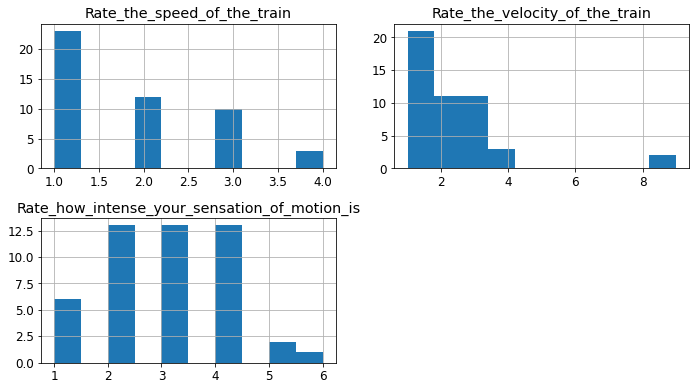

In [ ]:
columns_to_plot = ['Rate_the_speed_of_the_train', 'Rate_the_velocity_of_the_train', 'Rate_how_intense_your_sensation_of_motion_is']
fig = plt.figure(figsize=(10,8))
for i, column in enumerate(columns_to_plot):
#    ax = fig.add_subplot(3,3,i+1)
    ax = fig.add_subplot(3,2,i+1)

    listings[column].hist(bins=10,ax=ax)
    ax.set_title(column)
fig.tight_layout()
plt.show()              

For the Question **Rate_the_speed_of_the_train** : 
- **47%** of the users selected **Group 1**
- **25%** of the users selected **Group 2**

For the question **Rate_the_velocity_of_the_train** : 
- **44%** of the users selected **Group 1**
- **22% **of the users selected **Group 3** and **Group 2**

For the question **Rate_how_intense_your_sensation_of_motion_is** :
- **27%** of the users have selected **Group 4** , **Group 3**  and **Group 2**



---


**For the next three questions** , the users have selected **Group 3 and Group 2** the most.


---



**Q : Rate_how_strong_is_your_sensation_of_self_motion**

**Q : Rate_the_intensity_of_your_perception_of_self_motion**

**Q :     Rate_the_intensity_of_your_sensation_of_self_motion_in_the_virtual_environment**

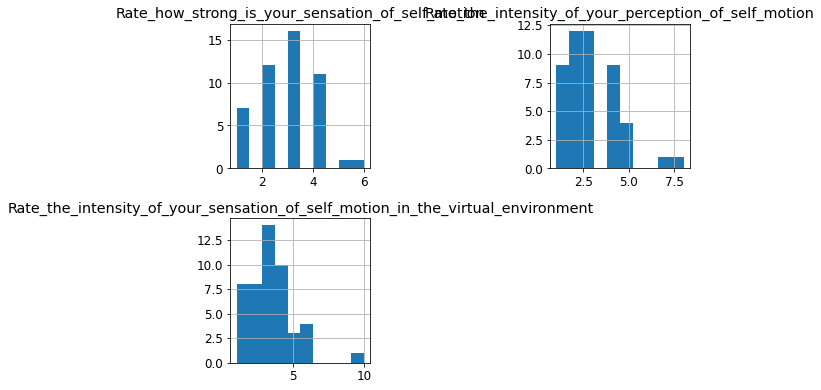

In [ ]:
columns_to_plot = ['Rate_how_strong_is_your_sensation_of_self_motion', 'Rate_the_intensity_of_your_perception_of_self_motion', 'Rate_the_intensity_of_your_sensation_of_self_motion_in_the_virtual_environment']
fig = plt.figure(figsize=(10,8))
for i, column in enumerate(columns_to_plot):
#    ax = fig.add_subplot(3,3,i+1)
    ax = fig.add_subplot(3,2,i+1)

    listings[column].hist(bins=10,ax=ax)
    ax.set_title(column)
fig.tight_layout()
plt.show() 

For the question **Rate_how_strong_is_your_sensation_of_self_motion** : 
- **33%** of the users selected **Group 3**
- **25%** of the users selected **Group 2**

For the question **Rate_the_intensity_of_your_perception_of_self_motion** : 
- **25%** of the users selected **Group 3** and **Group 2**

For the question
      **Rate_the_intensity_of_your_sensation_of_self_motion_in_the_virtual_environment**: 
- **29%** of the users selected **Group 3**
- **20%** of the users selected **Group 4**



---


**For the last four questions** , the user has selected **Group 3 and Group 2** the most.


---



**Q : Rate_your_perception_of_speed**

**Q : Rate_your_perceived_motion**

**Q : Rate_your_perception_of_self_motion**

**Q : Rate_your_perceived _movement**

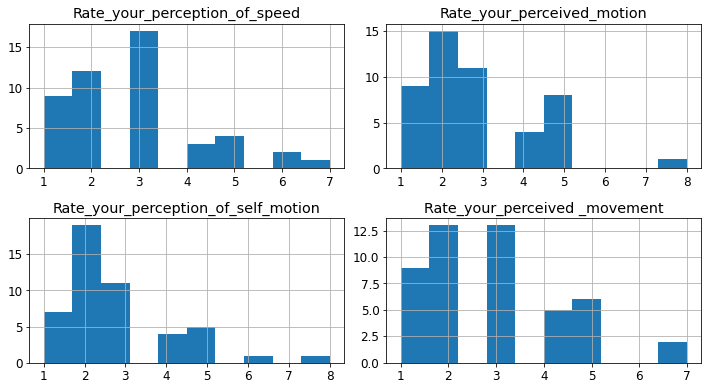

In [ ]:
columns_to_plot = ['Rate_your_perception_of_speed', 'Rate_your_perceived_motion', 
                   'Rate_your_perception_of_self_motion', 'Rate_your_perceived _movement']
fig = plt.figure(figsize=(10,8))
for i, column in enumerate(columns_to_plot):
#    ax = fig.add_subplot(3,3,i+1)
    ax = fig.add_subplot(3,2,i+1)

    listings[column].hist(bins=10,ax=ax)
    ax.set_title(column)
fig.tight_layout()
plt.show() 

For the Question **Rate_your_perception_of_speed**: 
- **35%** of the users selected **Group 3**
- **25%** of the users selected **Group 2**

For the question **Rate_your_perceived_motion**:
- **31%** of the users selected **Group 2**
- **22%** of the users selected **Group 3**

For the question **Rate_your_perception_of_self_motion** :
- **40%** of the users selected **Group 2**
- **22%** of the users selected **Group 3**

For the question **Rate_your_perceived _movement**: 
- **27%** of the users have selected **Group 3** and **Group 2**

**Word cloud data visulization**

Word Cloud is a data visualization technique used for representing text data in which the size of each word indicates its frequency or importance. Significant textual data points is being highlighted using a word cloud.

**WORD CLOUD OF USER'S JUSTIFICATION FOR SELECTING GROUP_1**

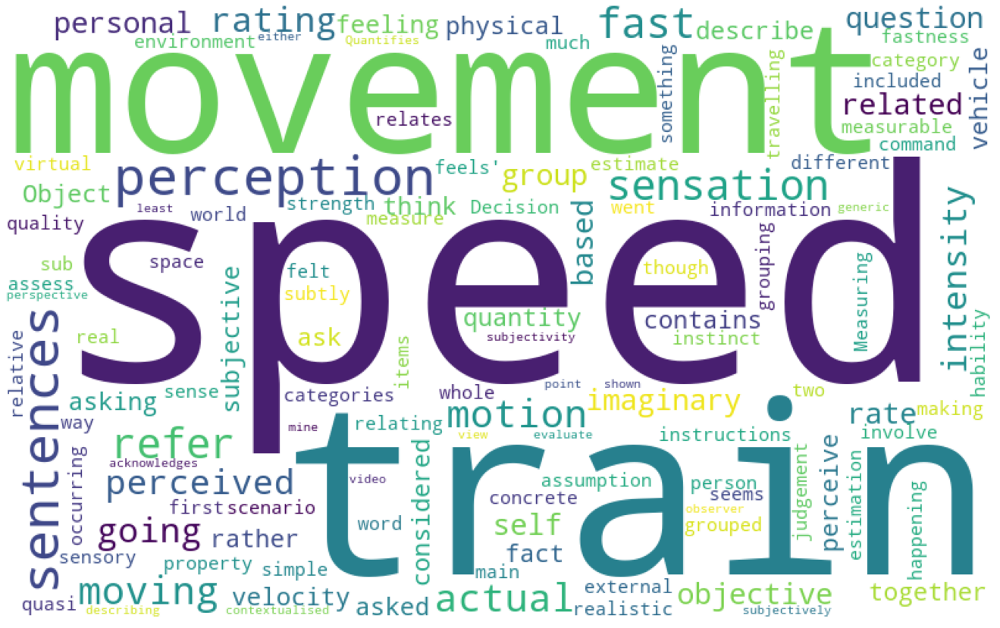

In [ ]:
from wordcloud import WordCloud
plt.subplots(figsize=(25,15))
wordcloud = WordCloud(background_color='white',width=800,height=500).generate(" ".join(surveyData.Group_1))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

From the above wordcloud plot the most frequently used words by the user is highlighted bigger as shown in the above figure , which are : **Train** , **Speed** ,**movement**.

In [ ]:
wordfreq = wordcloud.words_
wordfreq

{'Decision': 0.047619047619047616,
 'Measuring': 0.047619047619047616,
 'Object': 0.09523809523809523,
 'Quantifies': 0.047619047619047616,
 'acknowledges': 0.047619047619047616,
 'actual': 0.23809523809523808,
 'ask': 0.09523809523809523,
 'asked': 0.09523809523809523,
 'asking': 0.09523809523809523,
 'assess': 0.047619047619047616,
 'assumption': 0.047619047619047616,
 'based': 0.14285714285714285,
 'categories': 0.047619047619047616,
 'category': 0.047619047619047616,
 'command': 0.047619047619047616,
 'concrete': 0.047619047619047616,
 'considered': 0.09523809523809523,
 'contains': 0.09523809523809523,
 'contextualised': 0.047619047619047616,
 'describe': 0.09523809523809523,
 'describing': 0.047619047619047616,
 'different': 0.047619047619047616,
 'either': 0.047619047619047616,
 'environment': 0.047619047619047616,
 'estimate': 0.047619047619047616,
 'estimation': 0.047619047619047616,
 'evaluate': 0.047619047619047616,
 'external': 0.047619047619047616,
 'fact': 0.0952380952380

The frequency count of the words are in the range of 0 -1. Higher the value , higher is the frequency of occurance of words :

- Train = **0.7619047619047619**
- Speed = **1.0**
- Movement = **0.47619047619047616**

**WORD CLOUD OF USER'S JUSTIFICATION FOR SELECTING GROUP_2**

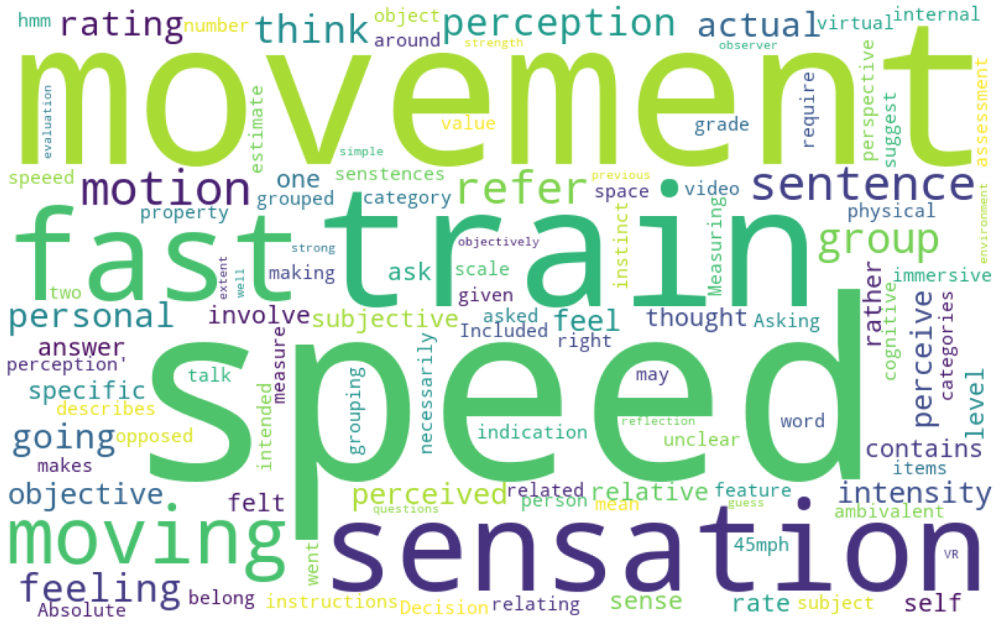

In [ ]:
from wordcloud import WordCloud
plt.subplots(figsize=(25,15))
wordcloud = WordCloud(background_color='white',width=800,height=500).generate(" ".join(surveyData.Group_2))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

From the above wordcloud plot the most frequently used words by the user is highlighted bigger as shown above , which are : **Speed** , **Train** ,**movement** , **sensation**.

In [ ]:
wordfreq = wordcloud.words_
wordfreq

{'45mph': 0.06666666666666667,
 'Absolute': 0.06666666666666667,
 'Asking': 0.06666666666666667,
 'Decision': 0.06666666666666667,
 'Included': 0.06666666666666667,
 'Measuring': 0.06666666666666667,
 'VR': 0.06666666666666667,
 'actual': 0.26666666666666666,
 'ambivalent': 0.06666666666666667,
 'answer': 0.13333333333333333,
 'around': 0.06666666666666667,
 'ask': 0.13333333333333333,
 'asked': 0.06666666666666667,
 'assessment': 0.06666666666666667,
 'belong': 0.06666666666666667,
 'categories': 0.06666666666666667,
 'category': 0.06666666666666667,
 'cognitive': 0.06666666666666667,
 'contains': 0.13333333333333333,
 'describes': 0.06666666666666667,
 'environment': 0.06666666666666667,
 'estimate': 0.06666666666666667,
 'evaluation': 0.06666666666666667,
 'extent': 0.06666666666666667,
 'fast': 0.5333333333333333,
 'feature': 0.06666666666666667,
 'feel': 0.2,
 'feeling': 0.3333333333333333,
 'felt': 0.13333333333333333,
 'given': 0.06666666666666667,
 'going': 0.26666666666666666,

The frequency count of the words are :

- Speed = **1.0**
- Movement = **0.9333333333333333**
- Train = **0.6**
- Sensation = **0.5333333333333333**

Plotting Pie chart for values greater than 0.60

In [ ]:
len(wordfreq)

112

In [ ]:

frequent_values = [*wordfreq.values()]


In [ ]:
a= {}
for val in range(len(frequent_values)):
  if frequent_values[val] >= 0.60:
    a[val]= frequent_values[val]
    print(a)
    

{0: 1.0}
{0: 1.0, 1: 0.9333333333333333}
{0: 1.0, 1: 0.9333333333333333, 2: 0.6}


In [ ]:
a

{0: 1.0, 1: 0.9333333333333333, 2: 0.6}

In [ ]:
values_2 = [*a.values()]
values_2

[1.0, 0.9333333333333333, 0.6]

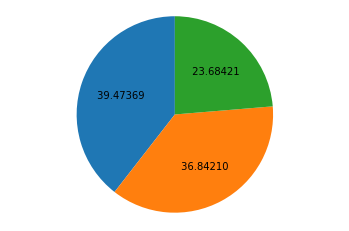

In [ ]:
# import the pyplot library

import matplotlib.pyplot as plotter
#print(a)

figureObject, axesObject = plotter.subplots()

# Draw the pie chart

axesObject.pie(values_2,

        #labels=,

        autopct='%9.5f',

        startangle=90)

# Aspect ratio - equal means pie is a circle
axesObject.axis('equal')

 plotter.show()

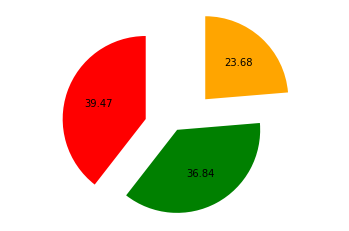

In [ ]:
# import the pyplot library

import matplotlib.pyplot as plotter

group__2     = values_2
 

figureObject, axesObject = plotter.subplots()

 

explode = (0.4, 0.0, 0.5)

colors  = ("red", "green", "orange") #"cyan", "brown", "grey", "blue", "indigo", "beige", "yellow")

 

# Draw the pie chart

axesObject.pie(group__2,

               explode      = explode,

               colors       = colors,

               #labels       = ,

               autopct      = '%1.2f',

               startangle   = 90)

 

# Aspect ratio

axesObject.axis('equal')

 

plotter.show()

**WORD CLOUD OF USER'S JUSTIFICATION IN SELECTING FOR GROUP_3**

From the above wordcloud plot the most frequently used words by the user is highlighted bigger as shown above , which are : **Train** , **Speed** ,**Perception** , **movement**.

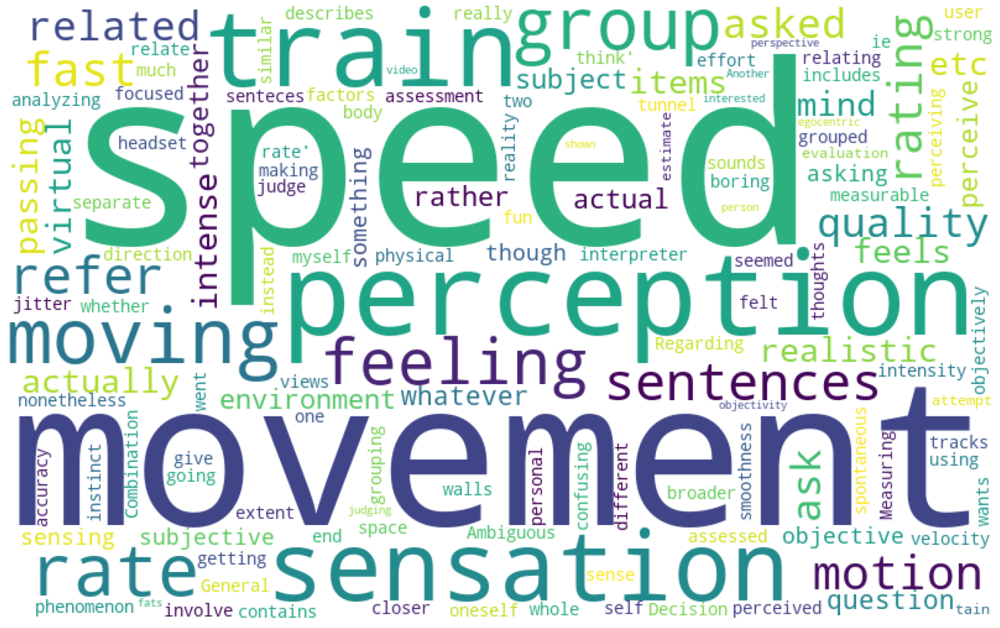

In [ ]:
from wordcloud import WordCloud
plt.subplots(figsize=(25,15))
wordcloud = WordCloud(background_color='white',width=800,height=500).generate(" ".join(surveyData.Group_3))
wordfreq = wordcloud.words_
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

In [ ]:
#WordCloud().process_text('speed movement sensation perception train moving')
wordfreq = wordcloud.words_
wordfreq

{'Ambiguous': 0.06666666666666667,
 'Another': 0.06666666666666667,
 'Combination': 0.06666666666666667,
 'Decision': 0.06666666666666667,
 'General': 0.06666666666666667,
 'Measuring': 0.06666666666666667,
 'Regarding': 0.06666666666666667,
 'accuracy': 0.06666666666666667,
 'actual': 0.13333333333333333,
 'actually': 0.13333333333333333,
 'analyzing': 0.06666666666666667,
 'ask': 0.2,
 'asked': 0.2,
 'asking': 0.13333333333333333,
 'assessed': 0.06666666666666667,
 'assessment': 0.06666666666666667,
 'attempt': 0.06666666666666667,
 'body': 0.06666666666666667,
 'boring': 0.06666666666666667,
 'broader': 0.06666666666666667,
 'closer': 0.06666666666666667,
 'confusing': 0.06666666666666667,
 'contains': 0.06666666666666667,
 'describes': 0.06666666666666667,
 'different': 0.06666666666666667,
 'direction': 0.06666666666666667,
 'effort': 0.06666666666666667,
 'egocentric': 0.06666666666666667,
 'end': 0.06666666666666667,
 'environment': 0.13333333333333333,
 'estimate': 0.0666666666

The frequency of it is obtained from below , where :

- Speed = **1.0**
- Movement = **0.9333333333333333**
- Perception = **0.8666666666666667**
- Train=**0.8**

**Group 4**

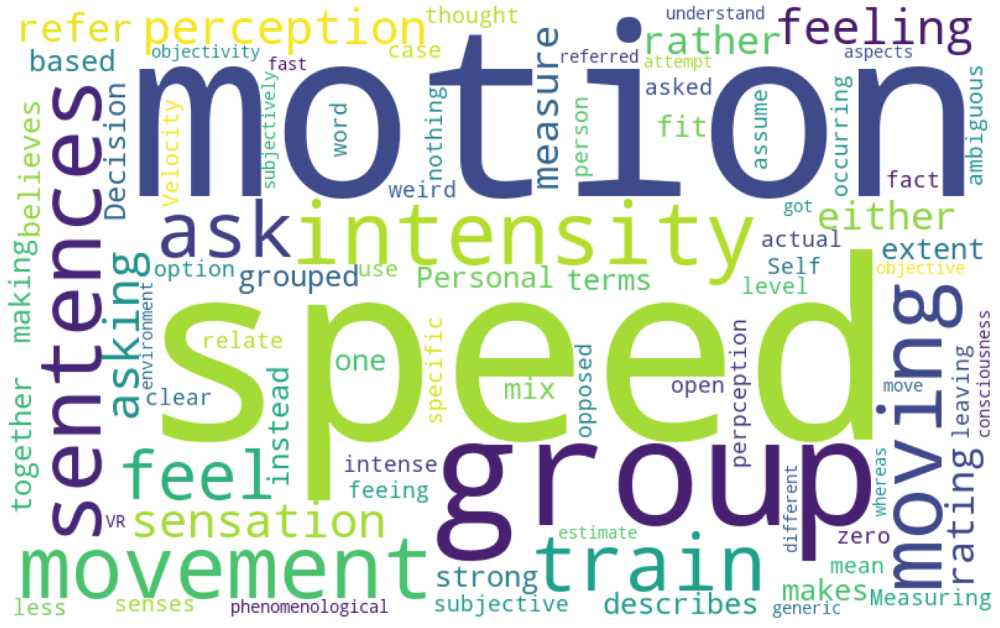

In [ ]:
from wordcloud import WordCloud
plt.subplots(figsize=(25,15))
wordcloud = WordCloud(background_color='white',width=800,height=500).generate(" ".join(surveyData.Group_4))
wordfreq = wordcloud.words_
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

In [ ]:
wordfreq = wordcloud.words_
wordfreq

{'Decision': 0.1111111111111111,
 'Measuring': 0.1111111111111111,
 'Personal': 0.1111111111111111,
 'Self': 0.1111111111111111,
 'VR': 0.1111111111111111,
 'Velocity': 0.1111111111111111,
 'actual': 0.1111111111111111,
 'ambiguous': 0.1111111111111111,
 'ask': 0.4444444444444444,
 'asked': 0.1111111111111111,
 'asking': 0.3333333333333333,
 'aspects': 0.1111111111111111,
 'assume': 0.1111111111111111,
 'attempt': 0.1111111111111111,
 'based': 0.1111111111111111,
 'believes': 0.1111111111111111,
 'case': 0.1111111111111111,
 'clear': 0.1111111111111111,
 'consciousness': 0.1111111111111111,
 'describes': 0.1111111111111111,
 'different': 0.1111111111111111,
 'either': 0.2222222222222222,
 'environment': 0.1111111111111111,
 'estimate': 0.1111111111111111,
 'extent': 0.1111111111111111,
 'fact': 0.1111111111111111,
 'fast': 0.1111111111111111,
 'feeing': 0.1111111111111111,
 'feel': 0.3333333333333333,
 'feeling': 0.3333333333333333,
 'fit': 0.1111111111111111,
 'generic': 0.11111111111

**Group 5**

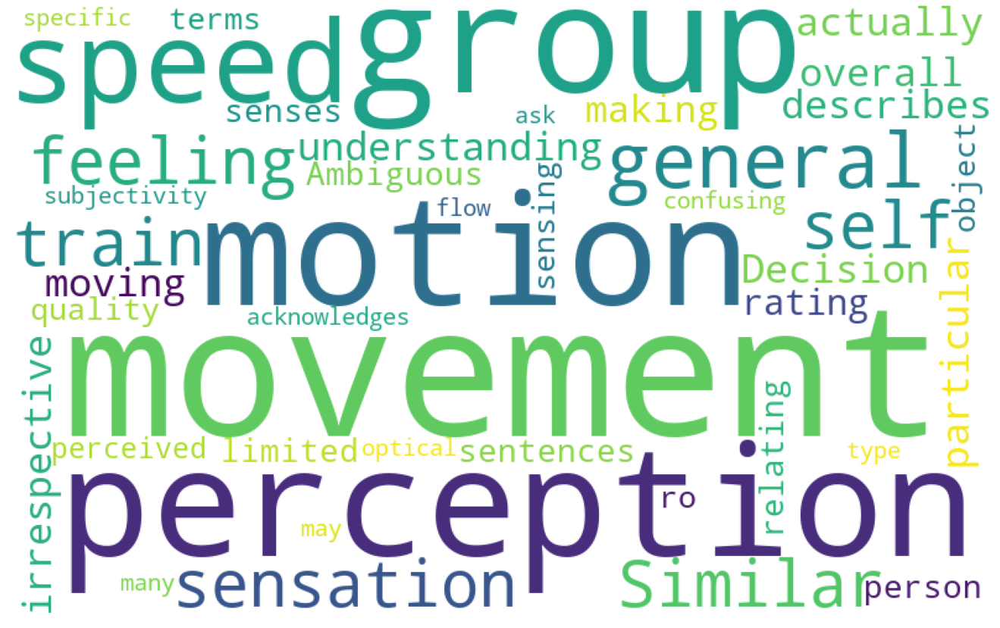

In [ ]:
from wordcloud import WordCloud
plt.subplots(figsize=(25,15))
wordcloud = WordCloud(background_color='white',width=800,height=500).generate(" ".join(surveyData.Group_5))
wordfreq = wordcloud.words_
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

In [ ]:
wordfreq = wordcloud.words_
wordfreq

{'Ambiguous': 0.16666666666666666,
 'Decision': 0.16666666666666666,
 'Similar': 0.3333333333333333,
 'acknowledges': 0.16666666666666666,
 'actually': 0.16666666666666666,
 'ask': 0.16666666666666666,
 'confusing': 0.16666666666666666,
 'describes': 0.16666666666666666,
 'feeling': 0.3333333333333333,
 'flow': 0.16666666666666666,
 'general': 0.5,
 'group': 0.6666666666666666,
 'irrespective': 0.16666666666666666,
 'limited': 0.16666666666666666,
 'making': 0.16666666666666666,
 'many': 0.16666666666666666,
 'may': 0.16666666666666666,
 'motion': 0.6666666666666666,
 'movement': 1.0,
 'moving': 0.16666666666666666,
 'object': 0.16666666666666666,
 'optical': 0.16666666666666666,
 'overall': 0.16666666666666666,
 'particular': 0.16666666666666666,
 'perceived': 0.16666666666666666,
 'perception': 0.6666666666666666,
 'person': 0.16666666666666666,
 'quality': 0.16666666666666666,
 'rating': 0.16666666666666666,
 'relating': 0.16666666666666666,
 'ro': 0.16666666666666666,
 'self': 0.33

# **Rough Work**

In [ ]:
cleaned_list = []
for m in tokens:
    stopped = [i for i in m if str(i).lower() not in stop_words] #remove stop words
    stemmed = [stemmer.stem(i) for i in stopped] #stem words
    cleaned_list.append(stemmed) #append stemmed words to list

backtodf = pd.DataFrame(cleaned_list) #convert list back to pandas dataframe
remove_NaN = backtodf.replace(np.nan, '', regex=True) #remove None (which return as words (str))
mergeddf = remove_NaN.astype(str).apply(lambda x: ' '.join(x), axis=1) #convert cells to strings, merge columns
mergeddf.value_counts()

speed train                                                                                                                                   2
refer percept sensat movement subject percept someth happen extern                                                                            1
sentenc speed                                                                                                                                 1
group speed train                                                                                                                             1
perceiv percept movement                                                                                                                      1
sentenc refer percept self motion                                                                                                             1
rate habil assess movement occur                                                                                                        

In [ ]:
counts_no_urls = collections.Counter(mergeddf)
counts_no_urls.most_common(15)
#15

[('speed train                     ', 2),
 ('group speed train                    ', 1),
 ('contain item relat speed movement                  ', 1),
 ('involv speed veloc simpl question                  ', 1),
 ('perceiv percept movement                    ', 1),
 ('instruct base assumpt felt realist sens motion ask rate speed movement way would real world scenario       ',
  1),
 ('rate physic properti object virtual space                 ', 1),
 ('feel percept whole environ                   ', 1),
 ('sentenc speed                     ', 1),
 ('group base actual speed self 3 sentenc vehicl 3 sentenc consid actual speed main categori consid two sub categori actual speed self vehicl',
  1),
 ('first group refer sentenc rel actual speed train               ', 1),
 ('person speed                     ', 1),
 ('quantiti fast                     ', 1),
 ('move                      ', 1),
 ('actual movement                     ', 1)]

In [ ]:
clean_tweets_no_urls = pd.DataFrame(counts_no_urls.most_common(15),
                             columns=['words', 'count'])

clean_tweets_no_urls.head()

,words,count
0,speed train,2
1,group speed train,1
2,contain item relat speed movement ...,1
3,involv speed veloc simpl question ...,1
4,perceiv percept movement,1


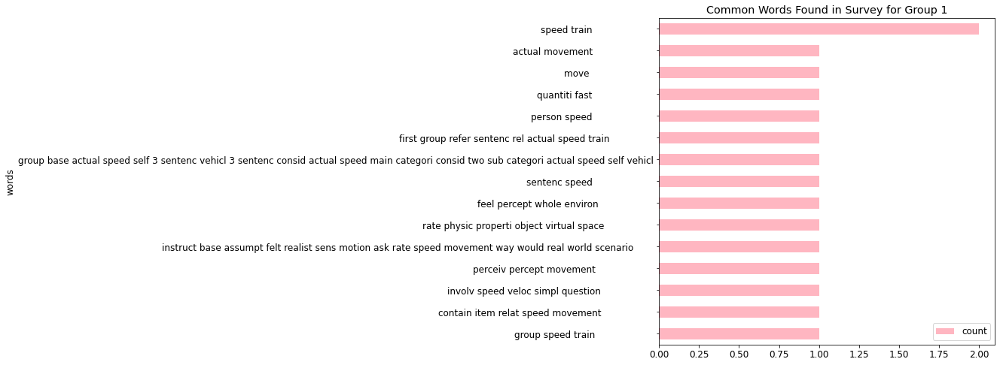

In [ ]:
fig, ax = plt.subplots(figsize=(8, 8))

# Plot horizontal bar graph
clean_tweets_no_urls.sort_values(by='count').plot.barh(x='words',
                      y='count',
                      ax=ax,
                      color="LIGHTPINK")

ax.set_title("Common Words Found in Survey for Group 1")

plt.show()

**Bag  of words tells about the frequency of the occurance of the words**

In [ ]:
sentence = "words don't come easy"
d = ["come", "together", "easy", "does", "it"]

s1 = set(sentence.split())
s2 = set(d)

print (s1.intersection(s2))

 **Word Cloud of User's Justification for all the seven groups**

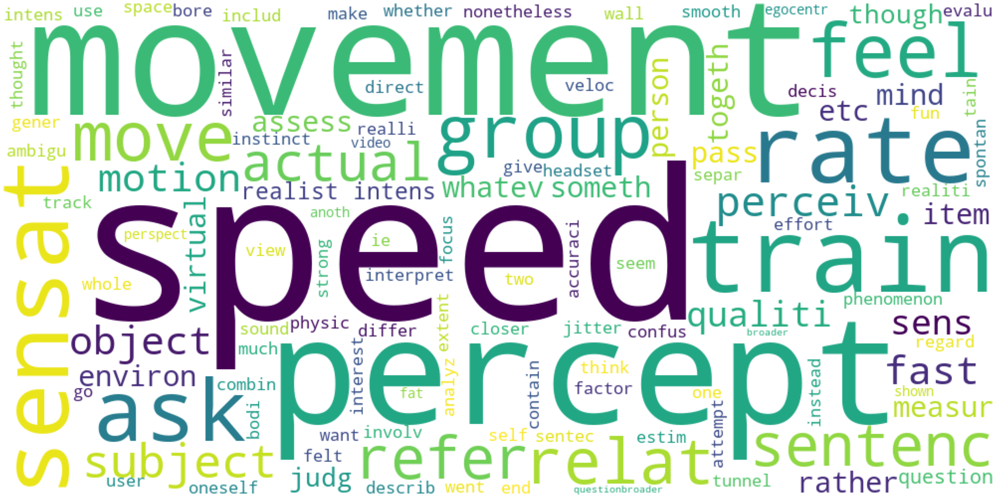

In [ ]:
from wordcloud import WordCloud
plt.subplots(figsize=(50,50))
#plt.subplots(figsize=(25,15))

wordcloud = WordCloud(background_color='white',width=1000,height=500).generate(" ".join(mergeddf))
#wordcloud = WordCloud(background_color='white',width=800,height=500).generate(" ".join(mergeddf))

plt.imshow(wordcloud)
plt.axis('off')
plt.show()

In [ ]:
wordfreq = wordcloud.words_
wordfreq

{'accuraci': 0.06666666666666667,
 'actual': 0.26666666666666666,
 'ambigu': 0.06666666666666667,
 'analyz': 0.06666666666666667,
 'anoth': 0.06666666666666667,
 'ask': 0.5333333333333333,
 'assess': 0.13333333333333333,
 'attempt': 0.06666666666666667,
 'bodi': 0.06666666666666667,
 'bore': 0.06666666666666667,
 'broader': 0.03333333333333333,
 'closer': 0.06666666666666667,
 'combin': 0.06666666666666667,
 'confus': 0.06666666666666667,
 'contain': 0.06666666666666667,
 'decis': 0.06666666666666667,
 'describ': 0.06666666666666667,
 'differ': 0.06666666666666667,
 'direct': 0.06666666666666667,
 'effort': 0.06666666666666667,
 'egocentr': 0.06666666666666667,
 'end': 0.06666666666666667,
 'environ': 0.13333333333333333,
 'estim': 0.06666666666666667,
 'etc': 0.13333333333333333,
 'evalu': 0.06666666666666667,
 'extent': 0.06666666666666667,
 'factor': 0.06666666666666667,
 'fast': 0.26666666666666666,
 'fat': 0.06666666666666667,
 'feel': 0.4666666666666667,
 'felt': 0.06666666666666

The most common words used by the user for all the seven groups are :
- Speed :1.0
-Perception : 0.8667
-Sensation : 0.666666
- Movement : 0.933333

**GROUP 3**

In [ ]:
tokenizer = RegexpTokenizer(r'\w+')
stemmer = PorterStemmer() 
stop_words = set(stopwords.words('english'))
group3 = listings.Group_3
#group4 = listings.Group_4
#group5 = listings.Group_5
#group6 = listings.Group_6
#group7 = listings.Group_7



TG3 = group3.values.tolist() #convert values to list of lists (each row becomes a separate list)
#TG4 = group4.values.tolist() 
#TG5 = group5.values.tolist() 
#TG6 = group6.values.tolist() 
#TG7 = group7.values.tolist() 



tokens2 = [tokenizer.tokenize(str(i)) for i in TG3] #tokenize words in lists
#tokens3 = [tokenizer.tokenize(str(i)) for i in TG4] #tokenize words in lists
#tokens4 = [tokenizer.tokenize(str(i)) for i in TG5] #tokenize words in lists
#tokens5 = [tokenizer.tokenize(str(i)) for i in TG6] #tokenize words in lists
#tokens6 = [tokenizer.tokenize(str(i)) for i in TG7] #tokenize words in lists

tokens2

[['This',
  'group',
  'has',
  'to',
  'do',
  'with',
  'what',
  'your',
  'own',
  'speed',
  'actually',
  'is'],
 ['contains',
  'items',
  'relating',
  'to',
  'how',
  'it',
  'feels',
  'to',
  'be',
  'moving'],
 ['All',
  'involve',
  'perception',
  'how',
  'your',
  'mind',
  'is',
  'analyzing',
  'all',
  'factors',
  'rate',
  'of',
  'tracks',
  'passing',
  'rate',
  'of',
  'walls',
  'passing',
  'end',
  'of',
  'tunnel',
  'not',
  'getting',
  'closer',
  'etc'],
 ['This', 'group', 'is', 'about', 'the', 'intensity', 'of', 'feeling'],
 ['These',
  'items',
  'ask',
  'you',
  'to',
  'rate',
  'your',
  'sensation',
  'i',
  'e',
  'whether',
  'your',
  'sensations',
  'were',
  'realistic',
  'or',
  'intense'],
 ['It',
  's',
  'about',
  'your',
  'perception',
  'itself',
  'in',
  'a',
  'virtual',
  'space'],
 ['The',
  'subject',
  'is',
  'myself',
  'not',
  'only',
  'about',
  'the',
  'speed',
  'of',
  'the',
  'train',
  'also',
  'includes',
  'm

In [ ]:
cleaned_list = []
for m in tokens2:
    stopped = [i for i in m if str(i).lower() not in stop_words] #remove stop words
    stemmed = [stemmer.stem(i) for i in stopped] #stem words
    cleaned_list.append(stemmed) #append stemmed words to list

backtodf = pd.DataFrame(cleaned_list) #convert list back to pandas dataframe
remove_NaN = backtodf.replace(np.nan, '', regex=True) #remove None (which return as words (str))
mergeddf = remove_NaN.astype(str).apply(lambda x: ' '.join(x), axis=1) #convert cells to strings, merge columns

In [ ]:
mergeddf.value_counts()

ambigu qualiti percept                                                                                                                            1
speed actual                                                                                                                                      1
group two sentenc togeth refer sensat rather percept actual movement                                                                              1
refer movement subject someth object measur                                                                                                       1
sensat movement                                                                                                                                   1
movement                                                                                                                                          1
subject speed train also includ feel train whole environ                                                        

In [ ]:
counts_no_urls = collections.Counter(mergeddf)
counts_no_urls.most_common(15)
#15

[('group speed actual                  ', 1),
 ('contain item relat feel move                ', 1),
 ('involv percept mind analyz factor rate track pass rate wall pass end tunnel get closer etc     ',
  1),
 ('group intens feel                  ', 1),
 ('item ask rate sensat e whether sensat realist intens            ', 1),
 ('percept virtual space                  ', 1),
 ('subject speed train also includ feel train whole environ            ', 1),
 ('sentenc speed train                  ', 1),
 ('group two sentenc togeth refer sensat rather percept actual movement           ',
  1),
 ('group refer perceiv movement train                ', 1),
 ('movement                    ', 1),
 ('broader question rate whatev user want rate qualiti sensat percept phenomenon could realist intens fun bore etc whatev mind interpret question',
  1),
 ('train move                   ', 1),
 ('virtual environ                   ', 1),
 ('refer physic feel                  ', 1)]

In [ ]:
clean_tweets_no_urls = pd.DataFrame(counts_no_urls.most_common(15),
                             columns=['words', 'count'])

clean_tweets_no_urls.head()

,words,count
0,group speed actual,1
1,contain item relat feel move,1
2,involv percept mind analyz factor rate track p...,1
3,group intens feel,1
4,item ask rate sensat e whether sensat realist ...,1


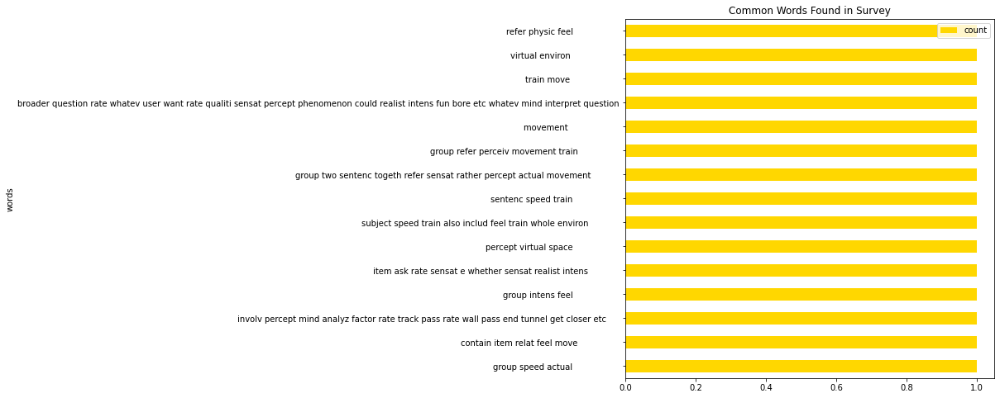

In [ ]:
fig, ax = plt.subplots(figsize=(8, 8))

# Plot horizontal bar graph
clean_tweets_no_urls.sort_values(by='count').plot.barh(x='words',
                      y='count',
                      ax=ax,
                      color="gold")

ax.set_title("Common Words Found in Survey")

plt.show()

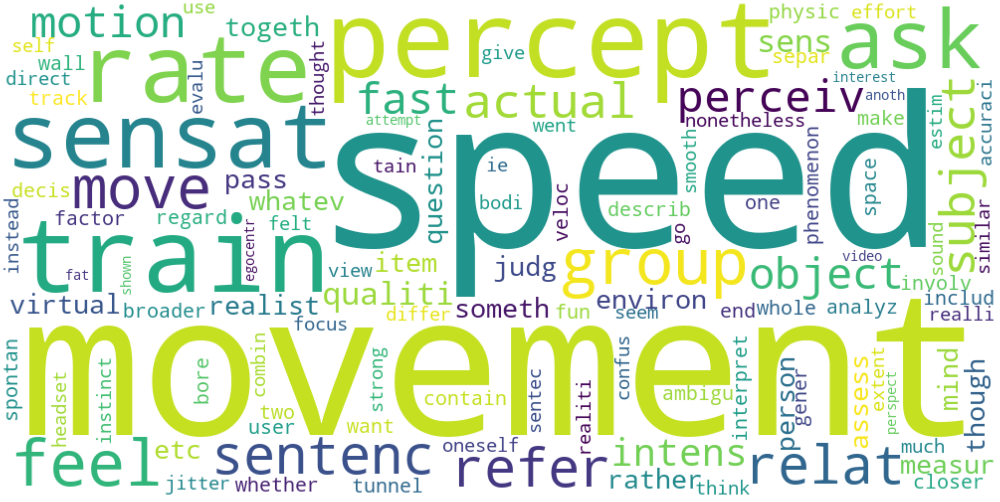

In [ ]:
from wordcloud import WordCloud
plt.subplots(figsize=(50,50))
#plt.subplots(figsize=(25,15))

wordcloud = WordCloud(background_color='white',width=1000,height=500).generate(" ".join(mergeddf))
#wordcloud = WordCloud(background_color='white',width=800,height=500).generate(" ".join(mergeddf))

plt.imshow(wordcloud)
plt.axis('off')
plt.show()

**GROUP 2**

In [ ]:
tokenizer = RegexpTokenizer(r'\w+')
stemmer = PorterStemmer() 
stop_words = set(stopwords.words('english'))
group2 = listings.Group_2
#group3 = listings.Group_3
#group4 = listings.Group_4
#group5 = listings.Group_5
#group6 = listings.Group_6
#group7 = listings.Group_7



TG2 = group2.values.tolist() #convert values to list of lists (each row becomes a separate list)
#TG3 = group3.values.tolist() #convert values to list of lists (each row becomes a separate list)
#TG4 = group4.values.tolist() 
#TG5 = group5.values.tolist() 
#TG6 = group6.values.tolist() 
#TG7 = group7.values.tolist() 



tokens1 = [tokenizer.tokenize(str(i)) for i in TG2] #tokenize words in lists
#tokens2 = [tokenizer.tokenize(str(i)) for i in TG3] #tokenize words in lists
#tokens3 = [tokenizer.tokenize(str(i)) for i in TG4] #tokenize words in lists
#tokens4 = [tokenizer.tokenize(str(i)) for i in TG5] #tokenize words in lists
#tokens5 = [tokenizer.tokenize(str(i)) for i in TG6] #tokenize words in lists
#tokens6 = [tokenizer.tokenize(str(i)) for i in TG7] #tokenize words in lists

#Tokens_of_all_groups = tokens+tokens1+tokens2+tokens3#+tokens4+tokens5+tokens6

#mergeddf

tokens1
#tokens2

[['This',
  'group',
  'has',
  'to',
  'do',
  'with',
  'what',
  'you',
  'think',
  'about',
  'your',
  'own',
  'speed'],
 ['contains', 'items', 'relating', 'to', 'perception', 'of', 'movement'],
 ['All',
  'involve',
  'sensation',
  'how',
  'the',
  'video',
  'makes',
  'you',
  'feel'],
 ['The',
  'train',
  'and',
  'I',
  'are',
  'one',
  'this',
  'is',
  'about',
  'how',
  'fast',
  'we',
  'are',
  'moving'],
 ['These',
  'instructions',
  'are',
  'ambivalent',
  'It',
  'is',
  'unclear',
  'if',
  'the',
  'intended',
  'answer',
  'is',
  'a',
  'speed',
  'Group',
  '1',
  'or',
  'an',
  'indication',
  'of',
  'how',
  'immersive',
  'your',
  'sensation',
  'of',
  'movement',
  'was',
  'Group',
  '3'],
 ['It',
  's',
  'about',
  'rating',
  'a',
  'physical',
  'property',
  'of',
  'yourself',
  'in',
  'a',
  'virtual',
  'space'],
 ['The',
  'subject',
  'is',
  'train',
  'more',
  'about',
  'the',
  'speed',
  'of',
  'the',
  'train',
  'itself'],
 [

In [ ]:
cleaned_list = []
for m in tokens1:
    stopped = [i for i in m if str(i).lower() not in stop_words] #remove stop words
    stemmed = [stemmer.stem(i) for i in stopped] #stem words
    cleaned_list.append(stemmed) #append stemmed words to list

backtodf = pd.DataFrame(cleaned_list) #convert list back to pandas dataframe
remove_NaN = backtodf.replace(np.nan, '', regex=True) #remove None (which return as words (str))
mergeddf = remove_NaN.astype(str).apply(lambda x: ' '.join(x), axis=1) #convert cells to strings, merge columns


In [ ]:
mergeddf.value_counts()

involv sensat video make feel                                                                   1
feel motion                                                                                     1
felt like cognit assess movement like hmm 45mph                                                 1
measur intens perceiv feel around movement necessarili speed                                    1
contain sentenc refer person perceiv movement                                                   1
ask speed think go person perspect                                                              1
sentenc extent observ feel like move strength feel                                              1
group refer sentenc rel actual speed                                                            1
subject train speed train                                                                       1
absolut speeed                                                                                  1
rate actual movement

In [ ]:
counts_no_urls = collections.Counter(mergeddf)
counts_no_urls.most_common(15)
#15

[('group think speed            ', 1),
 ('contain item relat percept movement          ', 1),
 ('involv sensat video make feel          ', 1),
 ('train one fast move           ', 1),
 ('instruct ambival unclear intend answer speed group 1 indic immers sensat movement group 3 ',
  1),
 ('rate physic properti virtual space          ', 1),
 ('subject train speed train           ', 1),
 ('senstenc percept speed            ', 1),
 ('sentenc belong categori percept sentenc refer perceiv movement motion oppos actual motion   ',
  1),
 ('group refer sentenc rel actual speed         ', 1),
 ('person motion             ', 1),
 ('specif featur grade level intens sensat percept        ', 1),
 ('feel speed             ', 1),
 ('percept              ', 1),
 ('sentenc refer think speed percept mean right        ', 1)]

In [ ]:
clean_tweets_no_urls = pd.DataFrame(counts_no_urls.most_common(15),
                             columns=['words', 'count'])

clean_tweets_no_urls.head()

,words,count
0,group think speed,1
1,contain item relat percept movement,1
2,involv sensat video make feel,1
3,train one fast move,1
4,instruct ambival unclear intend answer speed g...,1


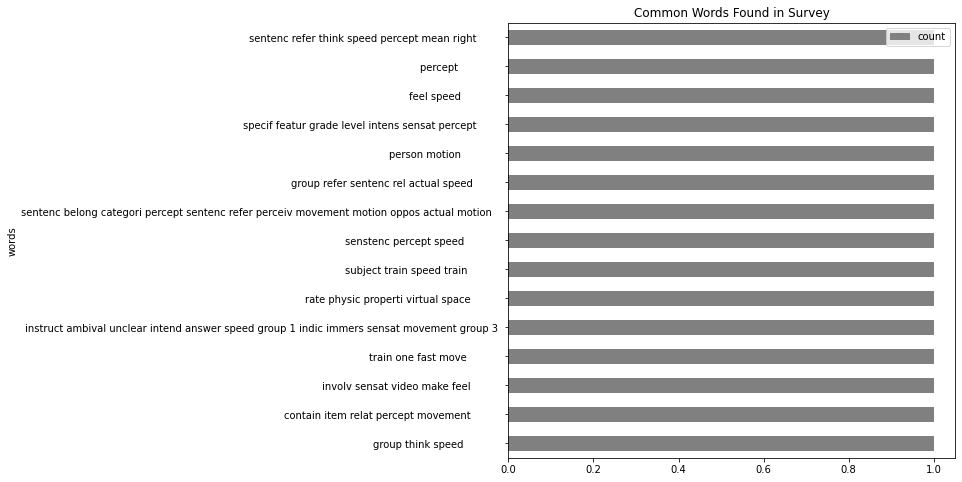

In [ ]:
fig, ax = plt.subplots(figsize=(8, 8))

# Plot horizontal bar graph
clean_tweets_no_urls.sort_values(by='count').plot.barh(x='words',
                      y='count',
                      ax=ax,
                      color="grey")

ax.set_title("Common Words Found in Survey")

plt.show()

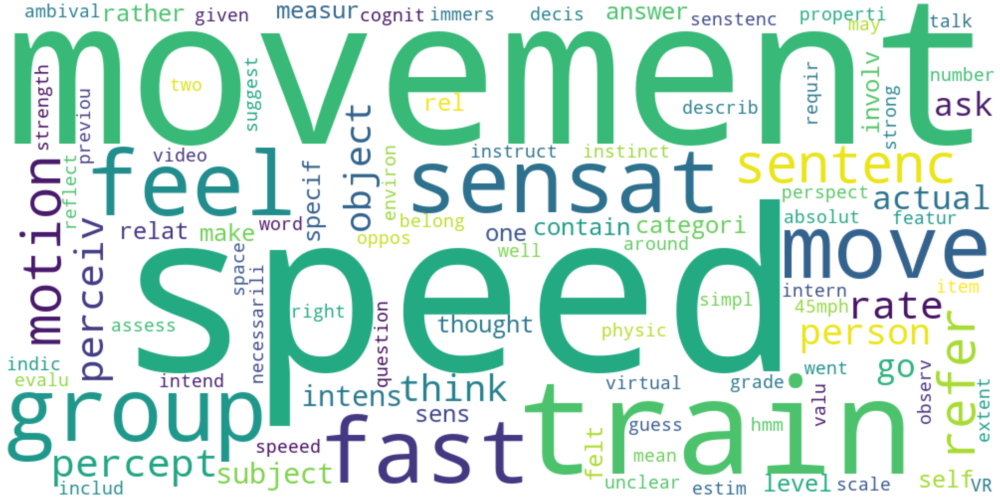

In [ ]:
from wordcloud import WordCloud
plt.subplots(figsize=(50,50))
#plt.subplots(figsize=(25,15))

wordcloud = WordCloud(background_color='white',width=1000,height=500).generate(" ".join(mergeddf))
#wordcloud = WordCloud(background_color='white',width=800,height=500).generate(" ".join(mergeddf))

plt.imshow(wordcloud)
plt.axis('off')
plt.show()

**Group 1**

In [ ]:
from nltk.corpus import stopwords
from nltk.tokenize import RegexpTokenizer
from nltk.stem import PorterStemmer
import pandas as pd
import numpy as np
import nltk
nltk.download('stopwords')

#load tokenizer, stemmer and stop words
tokenizer = RegexpTokenizer(r'\w+')
stemmer = PorterStemmer() 
stop_words = set(stopwords.words('english'))
group1 = listings.Group_1
#group2 = listings.Group_2
#group3 = listings.Group_3
#group4 = listings.Group_4
#group5 = listings.Group_5
#group6 = listings.Group_6
#group7 = listings.Group_7



TG1 = group1.values.tolist() #convert values to list of lists (each row becomes a separate list)
#TG2 = group2.values.tolist() #convert values to list of lists (each row becomes a separate list)
#TG3 = group3.values.tolist() #convert values to list of lists (each row becomes a separate list)
#TG4 = group4.values.tolist() 
#TG5 = group5.values.tolist() 
#TG6 = group6.values.tolist() 
#TG7 = group7.values.tolist() 



tokens = [tokenizer.tokenize(str(i)) for i in TG1] #tokenize words in lists
#tokens1 = [tokenizer.tokenize(str(i)) for i in TG2] #tokenize words in lists
#tokens2 = [tokenizer.tokenize(str(i)) for i in TG3] #tokenize words in lists
#tokens3 = [tokenizer.tokenize(str(i)) for i in TG4] #tokenize words in lists
#tokens4 = [tokenizer.tokenize(str(i)) for i in TG5] #tokenize words in lists
#tokens5 = [tokenizer.tokenize(str(i)) for i in TG6] #tokenize words in lists
#tokens6 = [tokenizer.tokenize(str(i)) for i in TG7] #tokenize words in lists

#Tokens_of_all_groups = tokens+tokens1+tokens2+tokens3#+tokens4+tokens5+tokens6

#mergeddf
tokens
#tokens1
#tokens2
#Tokens_of_all_groups

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


[['This',
  'group',
  'has',
  'to',
  'do',
  'with',
  'the',
  'speed',
  'of',
  'the',
  'train'],
 ['contains', 'items', 'relating', 'to', 'speed', 'of', 'movement'],
 ['All', 'involve', 'speed', 'and', 'velocity', 'most', 'simple', 'questions'],
 ['This',
  'is',
  'about',
  'how',
  'you',
  'perceive',
  'your',
  'perception',
  'of',
  'movement'],
 ['These',
  'instructions',
  'are',
  'based',
  'on',
  'the',
  'assumption',
  'that',
  'you',
  'felt',
  'a',
  'realistic',
  'sense',
  'of',
  'motion',
  'and',
  'they',
  'are',
  'asking',
  'you',
  'to',
  'rate',
  'the',
  'speed',
  'of',
  'that',
  'movement',
  'the',
  'same',
  'way',
  'you',
  'would',
  'in',
  'a',
  'real',
  'world',
  'scenario'],
 ['It',
  's',
  'about',
  'rating',
  'a',
  'physical',
  'property',
  'of',
  'an',
  'Object',
  'in',
  'a',
  'virtual',
  'space'],
 ['More',
  'about',
  'feeling',
  'perception',
  'of',
  'the',
  'whole',
  'environment'],
 ['These', 'sente

**Stemming and Removal of Stop words**

In [ ]:
cleaned_list = []
for m in tokens:
    stopped = [i for i in m if str(i).lower() not in stop_words] #remove stop words
    stemmed = [stemmer.stem(i) for i in stopped] #stem words
    cleaned_list.append(stemmed) #append stemmed words to list

backtodf = pd.DataFrame(cleaned_list) #convert list back to pandas dataframe
remove_NaN = backtodf.replace(np.nan, '', regex=True) #remove None (which return as words (str))
mergeddf = remove_NaN.astype(str).apply(lambda x: ' '.join(x), axis=1) #convert cells to strings, merge columns


In [ ]:
mergeddf


0                 group speed train                    
1     contain item relat speed movement             ...
2     involv speed veloc simpl question             ...
3          perceiv percept movement                    
4     instruct base assumpt felt realist sens motion...
5     rate physic properti object virtual space     ...
6         feel percept whole environ                   
7                    sentenc speed                     
8     group base actual speed self 3 sentenc vehicl ...
9     first group refer sentenc rel actual speed tra...
10                    person speed                     
11                   quantiti fast                     
12                           move                      
13                 actual movement                     
14    sentenc would refer concret fact speed veloc m...
15                  perceiv motion                     
16            person percept motion                    
17    describ intens quantiti sensori inform    

In [ ]:
mergeddf.value_counts()

speed train                                                                                                                                   2
move                                                                                                                                          1
percept movement                                                                                                                              1
sentenc refer percept self motion                                                                                                             1
quantifi speed train                                                                                                                          1
relat train                                                                                                                                   1
perceiv speed train acknowledg subject                                                                                                  

In [ ]:
counts_no_urls = collections.Counter(mergeddf)
counts_no_urls.most_common(15)
#15

[('speed train                     ', 2),
 ('group speed train                    ', 1),
 ('contain item relat speed movement                  ', 1),
 ('involv speed veloc simpl question                  ', 1),
 ('perceiv percept movement                    ', 1),
 ('instruct base assumpt felt realist sens motion ask rate speed movement way would real world scenario       ',
  1),
 ('rate physic properti object virtual space                 ', 1),
 ('feel percept whole environ                   ', 1),
 ('sentenc speed                     ', 1),
 ('group base actual speed self 3 sentenc vehicl 3 sentenc consid actual speed main categori consid two sub categori actual speed self vehicl',
  1),
 ('first group refer sentenc rel actual speed train               ', 1),
 ('person speed                     ', 1),
 ('quantiti fast                     ', 1),
 ('move                      ', 1),
 ('actual movement                     ', 1)]

In [ ]:
clean_tweets_no_urls = pd.DataFrame(counts_no_urls.most_common(15),
                             columns=['words', 'count'])

clean_tweets_no_urls.head()

,words,count
0,speed train,2
1,group speed train,1
2,contain item relat speed movement ...,1
3,involv speed veloc simpl question ...,1
4,perceiv percept movement,1


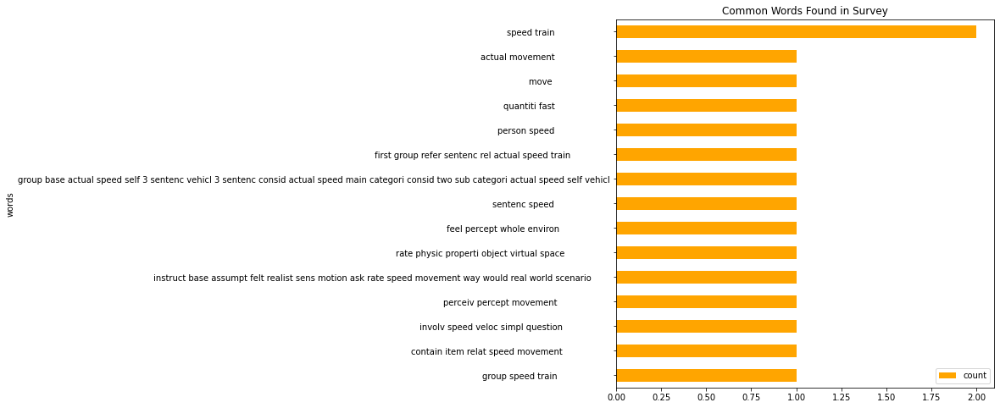

In [ ]:
fig, ax = plt.subplots(figsize=(8, 8))

# Plot horizontal bar graph
clean_tweets_no_urls.sort_values(by='count').plot.barh(x='words',
                      y='count',
                      ax=ax,
                      color="orange")

ax.set_title("Common Words Found in Survey")

plt.show()

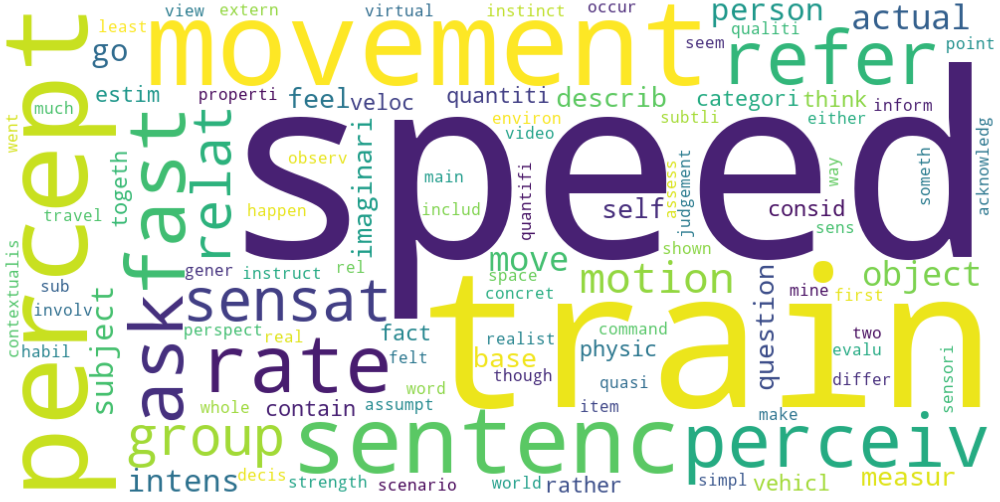

In [ ]:
from wordcloud import WordCloud
plt.subplots(figsize=(50,50))
#plt.subplots(figsize=(25,15))

wordcloud = WordCloud(background_color='white',width=1000,height=500).generate(" ".join(mergeddf))
#wordcloud = WordCloud(background_color='white',width=800,height=500).generate(" ".join(mergeddf))

plt.imshow(wordcloud)
plt.axis('off')
plt.show()

**Clustering**

In [ ]:
>>> from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
import numpy as np
import pandas as pd
>>> vectorizer = CountVectorizer(min_df=0, lowercase=False)
>>> vectorizer.fit(mergeddf)
>>> vectorizer.vocabulary_
X = vectorizer.fit_transform(mergeddf)

true_k = 2
model = KMeans(n_clusters=true_k, init='k-means++', max_iter=100, n_init=1)
model.fit(X)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=100,
       n_clusters=2, n_init=1, n_jobs=None, precompute_distances='auto',
       random_state=None, tol=0.0001, verbose=0)

In [ ]:
true_k = 2
model = KMeans(n_clusters=true_k, init='k-means++', max_iter=100, n_init=1)
model.fit(X)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=100,
       n_clusters=2, n_init=1, n_jobs=None, precompute_distances='auto',
       random_state=None, tol=0.0001, verbose=0)

In [ ]:
order_centroids = model.cluster_centers_.argsort()[:, ::-1]
terms = vectorizer.get_feature_names()

In [ ]:

for i in range(true_k):
 print('Cluster %d:' % i),

 for ind in order_centroids[i, :10]:
   print ( '%s'  % terms [ind] )
  

Cluster 0:
speed
movement
train
percept
sentenc
sensat
group
motion
ask
rate
Cluster 1:
nan
zero
got
immers
imaginari
imagin
ie
hmm
headset
happen


Sentences similarity 

In [ ]:
rom sklearn.metrics.pairwise import cosine_similarity

#get average vector for sentence 1
sentence_1 = "this is sentence number one"
sentence_1_avg_vector = avg_sentence_vector(sentence_1.split(), model=word2vec_model, num_features=100)

#get average vector for sentence 2
sentence_2 = "this is sentence number two"
sentence_2_avg_vector = avg_sentence_vector(sentence_2.split(), model=word2vec_model, num_features=100)

sen1_sen2_similarity =  cosine_similarity(sentence_1_avg_vector,sentence_2_avg_vector)

In [ ]:
# Python3 program to Check if given words  
# appear together in a list of sentence 
  
def check(sentence, words): 
    res = [all([k in s for k in words]) for s in sentence] 
    return [sentence[i] for i in range(0, len(res)) if res[i]] 
      
# Driver code 
sentence = ['python coder', 'geeksforgeeks', 'coder in geeksforgeeks'] 
words = ['coder', 'geeksforgeeks'] 
print(check(sentence, words)

['coder in geeksforgeeks']


In [ ]:
# Python3 program to Check if given words  
# appear together in a list of sentence 
  
def check(sentence, words): 
    res = [] 
    for substring in sentence: 
        k = [ w for w in words if w in substring ] 
        if (len(k) == len(words) ): 
            res.append(substring) 
              
    return res 
      
# Driver code 
sentence = ['python coder', 'geeksforgeeks', 'coder in geeksforgeeks'] 
words = ['coder', 'geeksforgeeks'] 
print(check(sentence, words)) 

In [ ]:
['coder in geeksforgeeks']


In [ ]:
# Python3 program to Check if given words  
# appear together in a list of sentence 
  
def check(sentence, words): 
    res = list(map(lambda x: all(map(lambda y:y in x.split(), 
                                          words)), sentence)) 
    return [sentence[i] for i in range(0, len(res)) if res[i]] 
      
# Driver code 
sentence = ['python coder', 'geeksforgeeks', 'coder in geeksforgeeks'] 
words = ['coder', 'geeksforgeeks'] 
print(check(sentence, words)) 

['coder in geeksforgeeks']


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
How many most common words to print: 5

OK. The 5 most common words are as follows

This group has to do with what your own speed actually is :  1
contains items relating to how it feels to be moving :  1
All involve perception how your mind is analyzing all factors (rate of tracks passing rate of walls passing end of tunnel not getting closer etc) :  1
This group is about the intensity of feeling  :  1
These items ask you to rate your sensation ie whether your sensations were realistic or intense :  1


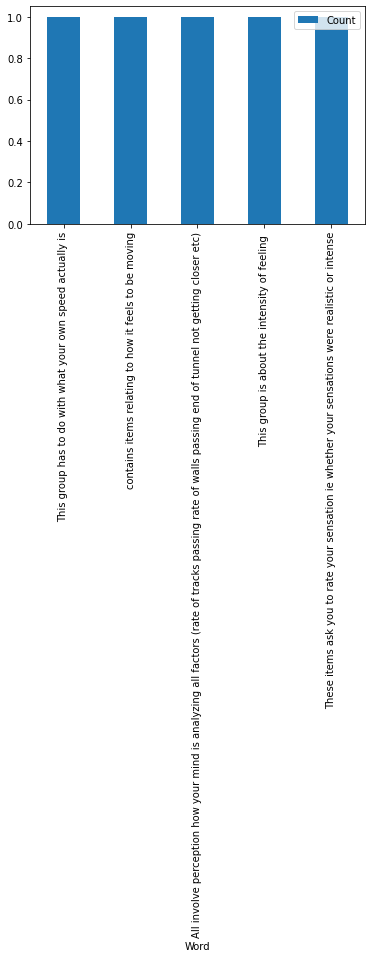

In [ ]:
from nltk.corpus import stopwords
from nltk.tokenize import RegexpTokenizer
from nltk.stem import PorterStemmer
import pandas as pd
import numpy as np
import nltk
nltk.download('stopwords')
import collections
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
# Read input file, note the encoding is specified here 
# It may be different in your text file
#file = open('PrideandPrejudice.txt', encoding="utf8")
a= TG3
# Stopwords
stopwords = set(stopwords.words('english'))
stopwords = stopwords.union(set(['mr','mrs','one','two','said']))
# Instantiate a dictionary, and for every word in the file, 
# Add to the dictionary if it doesn't exist. If it does, increase the count.
wordcount = {}
# To eliminate duplicates, remember to split by punctuation, and use case demiliters.
for word in a:
    word = word.replace(".","")
    word = word.replace(",","")
    word = word.replace(":","")
    word = word.replace("\"","")
    word = word.replace("!","")
    word = word.replace("â€œ","")
    word = word.replace("â€˜","")
    word = word.replace("*","")
    if word not in stopwords:
        if word not in wordcount:
            wordcount[word] = 1
        else:
            wordcount[word] += 1
# Print most common word
n_print = int(input("How many most common words to print: "))
print("\nOK. The {} most common words are as follows\n".format(n_print))
word_counter = collections.Counter(wordcount)
for word, count in word_counter.most_common(n_print):
    print(word, ": ", count)
# Close the file
#file.close()
# Create a data frame of the most common words 
# Draw a bar chart
lst = word_counter.most_common(n_print)
df = pd.DataFrame(lst, columns = ['Word', 'Count'])
df.plot.bar(x='Word',y='Count')

**clustering**`

In [ ]:
>>> from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
import numpy as np
import pandas as pd
#>>> vectorizer = CountVectorizer(min_df=0, lowercase=False)
#>>> vectorizer.fit(listings.Group_1 )
#>>> vectorizer.vocabulary_
X = vectorizer.fit_transform(listings.Group_1)

true_k = 2
model = KMeans(n_clusters=true_k, init='k-means++', max_iter=100, n_init=1)
model.fit(X)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=100,
       n_clusters=2, n_init=1, n_jobs=None, precompute_distances='auto',
       random_state=None, tol=0.0001, verbose=0)

In [ ]:
true_k = 2
model = KMeans(n_clusters=true_k, init='k-means++', max_iter=100, n_init=1)
model.fit(X)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=100,
       n_clusters=2, n_init=1, n_jobs=None, precompute_distances='auto',
       random_state=None, tol=0.0001, verbose=0)

In [ ]:
order_centroids = model.cluster_centers_.argsort()[:, ::-1]
terms = vectorizer.get_feature_names()

In [ ]:
for i in range(true_k):
 print('Cluster %d:' % i),
 for ind in order_centroids[i, :10]:
   print ( '%s'  % terms [ind] )

Cluster 0:
the
of
speed
to
train
sentences
movement
about
perception
and
Cluster 1:
me
sensation
to
the
itself
intensity
that
than
subtly
all


https://towardsdatascience.com/applying-machine-learning-to-classify-an-unsupervised-text-document-e7bb6265f52

In [ ]:
>>> from sklearn.feature_extraction.text import CountVectorizer

>>> vectorizer = CountVectorizer(min_df=0, lowercase=False)
>>> vectorizer.fit(listings.Group_2 )
>>> vectorizer.vocabulary_

In [ ]:
>>> from sklearn.feature_extraction.text import CountVectorizer

>>> vectorizer = CountVectorizer(min_df=0, lowercase=False)
>>> vectorizer.fit(listings.Group_3 )
>>> vectorizer.vocabulary_

## **NLP** 

The users justification for the grouping is an unstructured data . Text mining needs to be carried out in order to obtain a meaningful information.

The preprocessing of the unstructured data involves the following steps : 
- **Tokenization** : Breaking  complex sentence to words and estimating its importance in a sentence and its structureal description . The frequency of each words can be obtained by converting the words into tokens.
-**Stemming**
-**Lemmatization**
-**Removal of stop words**

**Tokensization**  

In [ ]:



import nltk
import nltk.corpus
from nltk.tokenize import word_tokenize

# sample text for performing tokenization
text = listings.Group_3
text
#nltk.download('punkt')
#token = word_tokenize(text)
#token


0     This group has to do with what your own speed ...
1     contains items relating to how it feels to be ...
2     All involve perception, how your mind is analy...
3         This group is about the intensity of feeling 
4     These items ask you to rate your sensation, i....
5     It's about your perception itself in a virtual...
6     The subject is myself - not only about the spe...
7     These sentences are all about the speed of the...
8     I grouped these two sentences together as they...
9     This group refers to how you perceive the move...
10                                  All about movement.
11    The broader question of rating in whatever the...
12                         it is about the train moving
13                              In virtual environment 
14                     These refer to physical feelings
15                                     subjective speed
16                                  Regarding the train
17                        describes how the spee